# Develop more robust and precise models that can identify potential churners early and provide actionable insights for retention strategies.

## The steps of the process of prediction used in this project

- <b> < Data Collection > </b>:

The dataset contains customer behavior, interactions, and historical churn.

- <b> < Data Preprocessing > </b>:

Clean and preprocess the data by handling missing values, outliers, and encoding categorical variables.         Making the dataset suitable for ML.
     
     
- <b> < Feature Engineering ></b>:

Create meaningful features that can help the model make accurate predictions.
    This involves feature scaling, normalization, or generating new features based on domain knowledge.
    
    
- <b> < Data Splitting > </b>:

Split the dataset into training, validation, and test sets.
    A common split is 80% for training, 20% for testing. The validation set is taken as a separate dataset and is used for hyperparameter tuning.
    
    
- <b> < Model Selection > </b>:

Choose the appropriate machine learning algorithms for churn prediction.
    Common choices include K-nearest neighbors, support vector machine, logistic regression, random forests, decision trees, ada boost, gradient boosting, and voting.
    Consider using ensemble methods or stacking multiple models for better performance.


- <b> < Model Training > </b>:

Train the selected models using the training dataset.
    Tune hyperparameters to optimize model performance on the validation set.
    This may involve techniques like cross-validation.


- <b> < Model Evaluation > </b>:

Evaluate the model's performance using appropriate metrics such as accuracy, precision, recall,
    F1-score, ROC AUC, or customer-centric metrics like customer lifetime value (CLV).
    Compare the performance of different models and
    choose the one that best aligns with the business objectives.

- <b> < Finalizing The Most Suitable Model > </b>

Finalize the best model based on the metrics calculated.
    
- <b> < Feature Importance Analysis > </b>:

Understand which features are most important for making churn predictions.
    Feature importance analysis can help refine the model and provide insights into customer behavior.
    
    
- <b> < Model Deployment > </b>:

Once the model with satisfactory performance is selected, it can be deployed to a production environment where it can make real-time predictions. Consider using APIs or containerization for deployment.


- <b> < Predicting the churn using the hold-out dataset > </b>:

Feed in the hold-out dataset to the deployed model conduting all the activities applied during the model training.

## Further steps to be followed after the model deployment

- <b>Monitoring and Maintenance</b>:

Continuously monitor the model's performance in a production environment. Re-train the model periodically with new data to ensure it remains accurate as customer behavior changes over time.
    
    
- <b>Interpretability and Explainability</b>:

Understand how the model is making predictions. Use techniques like SHAP values or LIME to interpret and explain model decisions to stakeholders.


- <b>Feedback loop</b>:

Incorporate feedback from business stakeholders, customer support, and other relevant sources to improve the model over time.
    
    
- <b>Scale and Iterate</b>:

As your business evolves and gathers more data, consider scaling the model and iterating on the process to improve prediction accuracy and reduce churn.

## Libraries installed

- pandas
- numpy
- matplotlib
- plotly
- kaleido
- ydata-profiling (!pip install -U ydata-profiling)
- seaborn
- sklearn
- jupyter

## Special Notes

##### Run the below code to upgrade '<b>threadpoolctl</b>' library if the training code of <b>KNN</b> model throws an exception.

    - Mac: !pip install threadpoolctl --upgrade   
    - Windows: pip install threadpoolctl --upgrade   


##### Run the below code to install ydata-profiling  library
    - Mac: !pip install -U ydata-profiling
    - Windows: pip install -U ydata-profiling
    
##### Download plotly plots
    - pip install -U kaleido

## Feature Identification

## =======================================================================

In [1]:
# Libraries related to date and time
from datetime import datetime

## Global Variables

In [2]:
import os

# Initialize the program started time
mainStartTime = datetime.now()

# Initialize the ML start and end time.
startTime = datetime.now()
endTime = datetime.now()

# List of the column names
colNames = []

# Run visualization codes (1=Show Plots and other graphs)
showViz = 1

# Create directories if not exist

listFolders = ['distribution_bar', 'distribution_pie']

for f in listFolders:

    isExist = os.path.exists(f)

    if not isExist:
        os.makedirs(f)

##  < Data Collection >

#### Two datasets are selected to the entire process.

    - CustomerChurnDataset_TrainTest.csv - The dataset taken to train and test the models
    - CustomerChurnDataset_Holdout.csv   - The dataset taken to predict the most accurate and appropriate model

#### Importing the required libraries for data manupulation and visualization

In [3]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#### Reading the dataset into pandas DataFrame

In [4]:
df = pd.read_csv('CustomerChurnDataset_TrainTest.csv')

### Data exploration

In [5]:
# Show the number of columns and rows
df.shape

(7043, 33)

In [6]:
# View random sample of the dataset (5 observations)
df.sample(5)

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
3974,6838-HVLXG,1,United States,California,Keyes,95328,"37.555631, -120.911653",37.555631,-120.911653,Female,...,Month-to-month,No,Mailed check,20.30,246.7,No,0,27,4177,NaN
4026,9453-PATOS,1,United States,California,Gualala,95445,"38.848082, -123.50608",38.848082,-123.506080,Female,...,Two year,No,Mailed check,85.10,6155.4,No,0,39,4147,NaN
4636,0412-UCCNP,1,United States,California,Essex,92332,"34.9436, -115.287901",34.943600,-115.287901,Male,...,Two year,Yes,Electronic check,59.20,3175.85,No,0,33,5162,NaN
819,1432-FPAXX,1,United States,California,Beale Afb,95903,"39.125311, -121.392283",39.125311,-121.392283,Female,...,Month-to-month,Yes,Electronic check,30.60,856.35,Yes,1,77,3615,Product dissatisfaction
2186,2055-SIFSS,1,United States,California,Westmorland,92281,"33.03679, -115.60503",33.036790,-115.605030,Female,...,Month-to-month,No,Bank transfer (automatic),51.65,2838.55,No,0,24,4763,NaN


#### Statistics

In [7]:
df.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Churn Value,Churn Score,CLTV
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,93521.964646,36.282441,-119.798880,32.371149,64.761692,0.265370,58.699418,4400.295755
std,0.0,1865.794555,2.455723,2.157889,24.559481,30.090047,0.441561,21.525131,1183.057152
min,1.0,90001.000000,32.555828,-124.301372,0.000000,18.250000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.500000,0.000000,40.000000,3469.000000
50%,1.0,93552.000000,36.391777,-119.730885,29.000000,70.350000,0.000000,61.000000,4527.000000
75%,1.0,95351.000000,38.224869,-118.043237,55.000000,89.850000,1.000000,75.000000,5380.500000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,1.000000,100.000000,6500.000000


In [8]:
# View columns
df.columns

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')

In [9]:
# Data types
def showDataTypes():

    dfDtypes = pd.DataFrame({'Data Type': [], 'Count': []})
    count = 0
    lDtypes = []
    lCount = []

    for x in df.dtypes.unique():
        for y in df.dtypes:
            if x == y:
                count = count + 1
        lDtypes.append(x)
        lCount.append(count)

        count = 0

    dfDtypes['Data Type'] = lDtypes
    dfDtypes['Count'] = lCount

    return dfDtypes

In [10]:
# Observing data types
showDataTypes()

,Data Type,Count
0,object,24
1,int64,6
2,float64,3


#### Columns to be dropped

In [11]:
# Check 'City' column
df['City'].nunique()

1129

In [12]:
# Since there are 1129 unique categorical values in the 'City' column, one-hot coding cannot be applied.
# In order to avoid complications in the process, the 'City' column shoudl be dropped.

In [13]:
# 'CustomerID', 'Churn Score' and 'Churn Reason' are not considered dependent variables
df.drop(['CustomerID', 'City', 'Churn Score', 'Churn Reason'], axis=1, inplace=True)
df

,Count,Country,State,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,...,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,CLTV
0,1,United States,California,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,3239
1,1,United States,California,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,2701
2,1,United States,California,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,...,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,5372
3,1,United States,California,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,...,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,5003
4,1,United States,California,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,...,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,5340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,United States,California,92285,"34.341737, -116.539416",34.341737,-116.539416,Female,No,No,...,No internet service,No internet service,Two year,Yes,Bank transfer (automatic),21.15,1419.4,No,0,5306
7039,1,United States,California,92301,"34.667815, -117.536183",34.667815,-117.536183,Male,No,Yes,...,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No,0,2140
7040,1,United States,California,92304,"34.559882, -115.637164",34.559882,-115.637164,Female,No,Yes,...,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No,0,5560
7041,1,United States,California,92305,"34.1678, -116.86433",34.167800,-116.864330,Female,No,Yes,...,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No,0,2793


In [14]:
# Observing data types
showDataTypes()

,Data Type,Count
0,int64,5
1,object,21
2,float64,3


In [15]:
# Check the unique values in 'Churn Label' and 'Churn Value' features 

In [16]:
df['Churn Label'].unique()

array(['Yes', 'No'], dtype=object)

In [17]:
df['Churn Value'].unique()

array([1, 0])

In [18]:
# Validate 'Yes' and 'No' values in 'Churn Label' match with 1 and 0 in 'Churn Value'

In [19]:
# If the total = 7043 (total of observations), one features can be dropped. (In this case, the 'Churn Label' is to be dropped)

count1 = len(df.loc[(df['Churn Label'] == 'Yes') & (df['Churn Value'] == 1)])
count2 = len(df.loc[(df['Churn Label'] == 'No') & (df['Churn Value'] == 0)])

count1 + count2

7043

In [20]:
# Consider the 'Churn Value' as the dependent variable and to be predicted value. For the sake of ease, the
# name of the column get changed as 'Churn'

df.rename(columns = {'Churn Value':'Churn'}, inplace = True)

# Drop the 'Churn Label'
df.drop('Churn Label', axis=1, inplace=True)

In [21]:
# Check for unique values in dtype 'object' (categorical)

def showUniqueValues(df):
  colNames.clear()
  for column in df:
    colNames.append(column)
    if df[column].dtype =='object':
      print(f'{column} : {df[column].unique()}')

showUniqueValues(df)

Country : ['United States']
State : ['California']
Lat Long : ['33.964131, -118.272783' '34.059281, -118.30742' '34.048013, -118.293953'
 ... '40.346634, -120.386422' '41.813521, -121.492666'
 '39.191797, -120.212401']
Gender : ['Male' 'Female']
Senior Citizen : ['No' 'Yes']
Partner : ['No' 'Yes']
Dependents : ['No' 'Yes']
Phone Service : ['Yes' 'No']
Multiple Lines : ['No' 'Yes' 'No phone service']
Internet Service : ['DSL' 'Fiber optic' 'No']
Online Security : ['Yes' 'No' 'No internet service']
Online Backup : ['Yes' 'No' 'No internet service']
Device Protection : ['No' 'Yes' 'No internet service']
Tech Support : ['No' 'Yes' 'No internet service']
Streaming TV : ['No' 'Yes' 'No internet service']
Streaming Movies : ['No' 'Yes' 'No internet service']
Contract : ['Month-to-month' 'Two year' 'One year']
Paperless Billing : ['Yes' 'No']
Payment Method : ['Mailed check' 'Electronic check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
Total Charges : ['108.15' '151.65' '820.5' ..

In [22]:
# List of column names
colNames

['Count',
 'Country',
 'State',
 'Zip Code',
 'Lat Long',
 'Latitude',
 'Longitude',
 'Gender',
 'Senior Citizen',
 'Partner',
 'Dependents',
 'Tenure Months',
 'Phone Service',
 'Multiple Lines',
 'Internet Service',
 'Online Security',
 'Online Backup',
 'Device Protection',
 'Tech Support',
 'Streaming TV',
 'Streaming Movies',
 'Contract',
 'Paperless Billing',
 'Payment Method',
 'Monthly Charges',
 'Total Charges',
 'Churn',
 'CLTV']

## < Data preprocessing >


#### Function to check for missing data or NA values

In [23]:
null_rows_selector = df.isnull().any(axis=1)
null_row_count = df[null_rows_selector].shape[0]

df_null = df.isnull().groupby(df['Churn']).sum().transpose()
df_null['total'] = df.isnull().sum()
df_null['percent'] = (df_null['total']/len(df))*100
df_null = df_null[df_null.total!=0]

print("rows with null values:",null_row_count,", {:.2f}%".format((null_row_count/len(df))*100))
print('columns with null values:',df_null.shape[0])

df_null

rows with null values: 0 , 0.00%
columns with null values: 0


Churn,0,1,total,percent


### Check the correlation with the 'Churn' 

In [24]:
# Chi square independence test to see if the difference in distributions is statistically significant

contingency_table = pd.concat([df['Churn'].value_counts().rename("Overall"), df[null_rows_selector]['Churn'].value_counts().rename("within_null_rows")],axis=1).transpose()
contingency_table

Churn,0,1
Overall,5174.0,1869.0
within_null_rows,NaN,NaN


#### Check for Null values

In [25]:
for x in df.columns:
    if df[x].isna().sum() != 0:
        print(x, df[x].isna().sum())

In [26]:
# Only 'Churn Reason' column contains the null values. By observing the above results, it is identified that 
# the number of null values equals the number of rows where 'Churn Value' = 0. Since the 'Churn Reason' is not considered
# in this research, there are no null values in the dataset after dropping the 'Churn Reason' column.

In [27]:
from scipy.stats import chi2_contingency,ttest_ind

# chi square independence test
# Null Hypothesis HO: Distribution of Churn is independent of presence of null values


stat, p, dof, expected = chi2_contingency(contingency_table.values)
  
# interpret p-value
alpha = 0.05 # significance value for test
print('p value is ' + str(p))

print('Dependent (reject H0)') if p <= alpha else print('Independent (H0 holds true)')

p value is nan
Independent (H0 holds true)


In [28]:
lowCorrelationFeatures = []
# Categorical low correlation features

lowCorrelationFeaturesC = []

# Numerical low correlation features
lowCorrelationFeaturesN = []

In [29]:
# Chi squared Independence test between categorical values and Churn. This will help to identify important variables on which Churn depends.
# Based on the test, we can recommend to drop/include them in while training
def chi2test(X,y,alpha=0.05):
    '''
        X : dataframe 
        y : series
    '''
    target = y.name
    print('ch2test with alpha',alpha)
    test_df = []
    for index,col in X.select_dtypes(include=['object']).columns.to_series().items():
        df = pd.concat([y,X[col]],axis=1)
        contingency_table = df.value_counts().rename("counts").reset_index().pivot(index=target,columns=col,values='counts').fillna(0)
        stat, p, dof, expected = chi2_contingency(contingency_table.values)
        test_df.append([target,col,stat,p,'Dependent (reject H0)' if p <= alpha else 'Independent (H0 holds true)','include' if p <= alpha else 'drop'])
        
    test_df = pd.DataFrame(test_df,columns=["variable1","variable2","chi2-stat","p-value","result","recommendation"])
    return test_df

df_chi = chi2test(df.drop('Churn',axis=1),df['Churn'])

lowCorrelationFeaturesC.extend(df_chi[df_chi.recommendation == 'drop']['variable2'].to_list())

df_chi

ch2test with alpha 0.05


,variable1,variable2,chi2-stat,p-value,result,recommendation
0,Churn,Country,0.000000,1.000000e+00,Independent (H0 holds true),drop
1,Churn,State,0.000000,1.000000e+00,Independent (H0 holds true),drop
2,Churn,Lat Long,1745.965514,5.117984e-02,Independent (H0 holds true),drop
3,Churn,Gender,0.484083,4.865787e-01,Independent (H0 holds true),drop
4,Churn,Senior Citizen,159.426300,1.510067e-36,Dependent (reject H0),include
5,Churn,Partner,158.733382,2.139911e-36,Dependent (reject H0),include
6,Churn,Dependents,433.734379,2.500972e-96,Dependent (reject H0),include
7,Churn,Phone Service,0.915033,3.387825e-01,Independent (H0 holds true),drop
8,Churn,Multiple Lines,11.330441,3.464383e-03,Dependent (reject H0),include
9,Churn,Internet Service,732.309590,9.571788e-160,Dependent (reject H0),include


In [30]:
# Print values of lowCorrelationFeatures in one line.

def fnPrintLowCorrelationFeatures(l1):
    
    n = len(l1)

    for i in l1:
        if i != l1[n-1]:
            print(i, end= ', ')
        else:
            print(i, end= ' ')

In [31]:
# View the list of categorical features with low correlation
fnPrintLowCorrelationFeatures(lowCorrelationFeaturesC)

Country, State, Lat Long, Gender, Phone Service, Total Charges 

In [32]:
# t test to check if means of a numerical variable differ significantly if Churn is different. 

def t_test(X,y,alpha=0.05):   
    target = y.name
    print('t_test with alpha',alpha)
    test_df = []
    for index,col in X.select_dtypes(exclude=['object']).columns.to_series().items():
        df = pd.concat([y,X[col]],axis=1)
        ttest_df = df.set_index(target,drop=True).fillna(0)
        stat, p = ttest_ind(ttest_df.loc[1],ttest_df.loc[0],equal_var=False)
        test_df.append([target,col,stat,p,'Dependent (reject H0)' if p <= alpha else 'Independent (H0 holds true)','include' if p <= alpha else 'drop'])
        
    test_df = pd.DataFrame(test_df,columns=["variable1","variable2","t-stat","p-value","result","recommendation"])
    return test_df

df_t_test = t_test(df.drop('Churn',axis=1),df['Churn'])

lowCorrelationFeaturesN.extend(df_t_test[df_t_test.recommendation == 'drop']['variable2'].to_list())

df_t_test

t_test with alpha 0.05


/users/hdnsameera/documents/data science/machine learning/customerchurnprediction/env/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:551: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, axis=axis, **kwds)


,variable1,variable2,t-stat,p-value,result,recommendation
0,Churn,Count,[nan],[nan],Independent (H0 holds true),drop
1,Churn,Zip Code,[0.28147881320846296],[0.7783607156946287],Independent (H0 holds true),drop
2,Churn,Latitude,[-0.28266467382878896],[0.7774517521124507],Independent (H0 holds true),drop
3,Churn,Longitude,[0.38490347263033636],[0.7003337645567782],Independent (H0 holds true),drop
4,Churn,Tenure Months,[-34.823818696312976],[1.1954945472607151e-232],Dependent (reject H0),include
5,Churn,Monthly Charges,[18.407526676414673],[8.59244933154705e-73],Dependent (reject H0),include
6,Churn,CLTV,[-10.690830470056563],[3.0489028460733125e-26],Dependent (reject H0),include


In [33]:
# View the list of columns to be dropped
lowCorrelationFeatures

[]

In [34]:
# View the list of numerical features with low correlation
fnPrintLowCorrelationFeatures(lowCorrelationFeaturesN)

Count, Zip Code, Latitude, Longitude 

In [35]:
# Merge categorical and numerical features with low correlation
lowCorrelationFeatures = lowCorrelationFeaturesC + lowCorrelationFeaturesN

In [36]:
# View the list of all the features with low correlation
fnPrintLowCorrelationFeatures(lowCorrelationFeatures)

Country, State, Lat Long, Gender, Phone Service, Total Charges, Count, Zip Code, Latitude, Longitude 

#### Drop columns

In [37]:
df.drop(lowCorrelationFeatures, axis=1, inplace=True)

In [38]:
df

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Churn,CLTV
0,No,No,No,2,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,1,3239
1,No,No,Yes,2,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,1,2701
2,No,No,Yes,8,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,1,5372
3,No,Yes,Yes,28,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,1,5003
4,No,No,Yes,49,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,1,5340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,No,No,No,72,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,Yes,Bank transfer (automatic),21.15,0,5306
7039,No,Yes,Yes,24,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,0,2140
7040,No,Yes,Yes,72,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,0,5560
7041,No,Yes,Yes,11,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,0,2793


In [39]:
# Analyize categorical type variables
showUniqueValues(df)

Senior Citizen : ['No' 'Yes']
Partner : ['No' 'Yes']
Dependents : ['No' 'Yes']
Multiple Lines : ['No' 'Yes' 'No phone service']
Internet Service : ['DSL' 'Fiber optic' 'No']
Online Security : ['Yes' 'No' 'No internet service']
Online Backup : ['Yes' 'No' 'No internet service']
Device Protection : ['No' 'Yes' 'No internet service']
Tech Support : ['No' 'Yes' 'No internet service']
Streaming TV : ['No' 'Yes' 'No internet service']
Streaming Movies : ['No' 'Yes' 'No internet service']
Contract : ['Month-to-month' 'Two year' 'One year']
Paperless Billing : ['Yes' 'No']
Payment Method : ['Mailed check' 'Electronic check' 'Bank transfer (automatic)'
 'Credit card (automatic)']


In [40]:
# Replace 'No internet service' and 'No phone service' values with 'No' in the entire dataset
df.replace('No internet service', 'No', inplace=True)
df.replace('No phone service', 'No', inplace=True)

In [41]:
# Analyize categorical type variables
showUniqueValues(df)

Senior Citizen : ['No' 'Yes']
Partner : ['No' 'Yes']
Dependents : ['No' 'Yes']
Multiple Lines : ['No' 'Yes']
Internet Service : ['DSL' 'Fiber optic' 'No']
Online Security : ['Yes' 'No']
Online Backup : ['Yes' 'No']
Device Protection : ['No' 'Yes']
Tech Support : ['No' 'Yes']
Streaming TV : ['No' 'Yes']
Streaming Movies : ['No' 'Yes']
Contract : ['Month-to-month' 'Two year' 'One year']
Paperless Billing : ['Yes' 'No']
Payment Method : ['Mailed check' 'Electronic check' 'Bank transfer (automatic)'
 'Credit card (automatic)']


### NA imputation

In [42]:
# NA imputation is not required for this dataset because there are now null values avaiable except for -
# - the 'Churn Reason'

## Descriptive analysis

### Five-Number Summary

In [43]:
df.describe()

,Tenure Months,Monthly Charges,Churn,CLTV
count,7043.000000,7043.000000,7043.000000,7043.000000
mean,32.371149,64.761692,0.265370,4400.295755
std,24.559481,30.090047,0.441561,1183.057152
min,0.000000,18.250000,0.000000,2003.000000
25%,9.000000,35.500000,0.000000,3469.000000
50%,29.000000,70.350000,0.000000,4527.000000
75%,55.000000,89.850000,1.000000,5380.500000
max,72.000000,118.750000,1.000000,6500.000000


### Data distribution - Pie charts
#### Churn visualization

In [44]:
import plotly.offline as po
import plotly.graph_objects as go
import plotly.io as pio

# Function to visualize the churn distribution
def fnChurnDistribution(df):  
    
    churn_key = df['Churn'].value_counts().keys().tolist()
    churn_value = df['Churn'].value_counts().values.tolist()

    plot_data = [
        go.Pie(labels=churn_key, values=churn_value, marker=dict(colors=['Teal','Gray'], line=dict(color='white', width=1.5)),
        rotation=90,
        hoverinfo="label+value+text",
        hole=0.6)
    ]

    plot_layout = go.Layout(dict(title="Customer Churn", plot_bgcolor='rgb(243, 243,243)', paper_bgcolor='rgb(243, 243, 243)',))

    fig = go.Figure(data=plot_data, layout=plot_layout)
    
    po.plot(fig, filename = f'{listFolders[1]}/Customer Churn.html', auto_open=False)
    
    po.iplot(fig)

if showViz == 1:
    fnChurnDistribution(df)

#### Categorical type features distribution analysis

In [45]:
# The following function is used to visualize the distribution of the other columns

# Function to visualize the distribution
def distributionPie(column):
  labels = df[column].unique()
  values = df[column].value_counts()

  fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=0.6, rotation=90)])
  fig.update_layout(title_text=f"{column} Distribution", plot_bgcolor='rgb(243, 243,243)')
  po.plot(fig, filename = f'{listFolders[1]}/{column}.html', auto_open=False)
  fig.show()

if showViz == 1:
            
    for column in df.drop(['Churn'], axis=1):
        if df[column].dtype =='object':
            distributionPie(column)

### Pandas profiling report

##### This report is an interactive data analysis report for quickly gaining insights into a dataset. The report provides a wide range of statistical and visual summaries of the data, helping data analysts and data scientists to understand the dataset's characteristics, identify potential issues, and make informed decisions about data preprocessing and analysis.

#### Generating the profiling report and saving as an HTML file.

In [46]:
import webbrowser

def runProfilingReport(fName):
    
    # ProfileReport started time
    startTime = datetime.now()

    from ydata_profiling import ProfileReport

    # Create pandas profiling report
    profReport = ProfileReport(df)

    # Download pandas profiling report in html format
    profReport.to_file(f'{fName}.html')

    endTime = datetime.now()
    
    # Open the html file
    filename = 'file:///'+os.getcwd()+'/' + f'{fName}.html'
    webbrowser.open(filename , new=2)

    print(f'Profile Report processing time : {endTime-startTime}')

In [47]:
if showViz == 1:
    runProfilingReport('Row Data Analysis')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profile Report processing time : 0:00:16.545168


#### View the profiling report.

In [48]:
# View pandas profiling report (This will take a few minutes to load the report)
# Since this takes a considerable amount of time to load, the report is saved as 'Row Data Analysis.html' in the directory.
# Open the exported html file to view the plots and other statistics instead.

# Uncomment the below code to view the report along with the code.

#profReport

#### Visualizing the distribution of numerical features by 'Churn' 

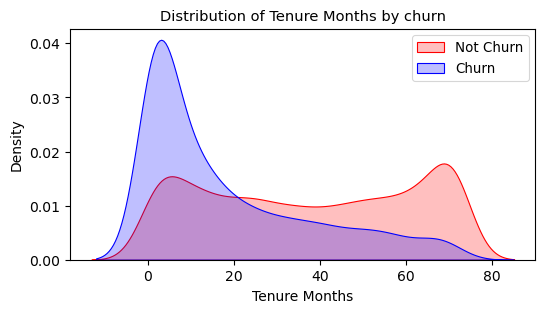

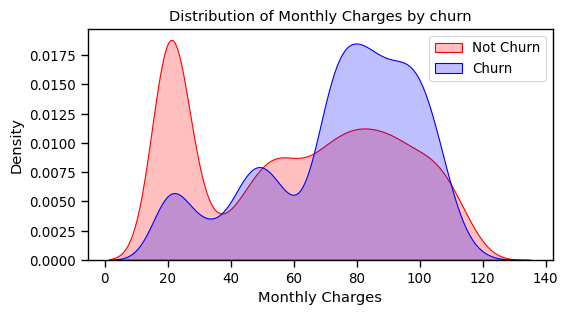

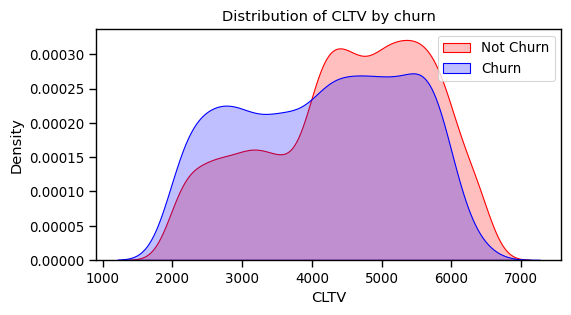

In [49]:
import seaborn as sns

if showViz == 1:

    for column in df.drop('Churn', axis=1):
        
        if df[column].dtype !='object':
            fig, ax = plt.subplots(figsize=(6, 3))
            sns.set_context("paper",font_scale=1.1)
            ax = sns.kdeplot(df[column][(df["Churn"] == 0) ],
                            color="Red", fill=True);
            ax = sns.kdeplot(df[column][(df["Churn"] == 1) ],
                            ax =ax, color="Blue", fill=True);
            ax.legend(["Not Churn","Churn"],loc='upper right');
            ax.set_ylabel('Density');
            ax.set_xlabel(column);
            ax.set_title(f'Distribution of {column} by churn');

#### Comparing the features statistically against 'Churn' values 'Yes' and 'No'

In [50]:
import plotly.express as px

def compareStatsWithChurn(colName):

  fig = px.box(df, x='Churn', y = colName)

  # Update yaxis properties
  fig.update_yaxes(title_text=colName, row=1, col=1)
  # Update xaxis properties
  fig.update_xaxes(title_text='Churn', row=1, col=1)

  # Update size and title
  fig.update_layout(autosize=True, width=750, height=600,
      title_font=dict(size=25, family='Courier'),
      title=f'<b>{colName} vs Churn</b>',
  )

  fig.show()

if showViz == 1 :
    for c in colNames:
        compareStatsWithChurn(c)

#### Analyzing 'Churn' vs other features

In [51]:
# Function to analyze customer churn vs other features

def churnHist(colName):
  fig, ax = plt.subplots(figsize=(6, 4))

  churn_yes = df[df.Churn==1][colName]
  churn_no = df[df.Churn==0][colName]

  ax.hist([churn_yes, churn_no], color=['red','purple'], label=['Yes','No'])
  ax.legend()

  ax.set(title=f'Customer churn vs {colName} analysis', xlabel=colName, ylabel='Number of customers')

  plt.savefig(f'{listFolders[0]}/{column}.png', dpi=100);

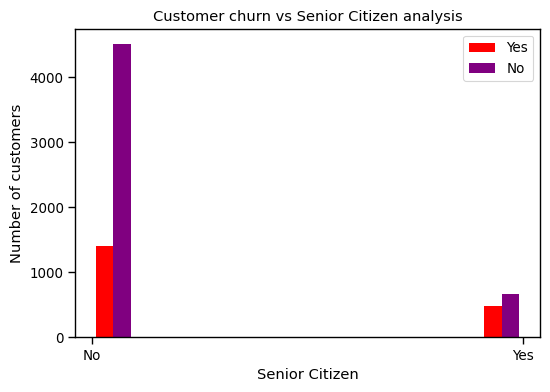

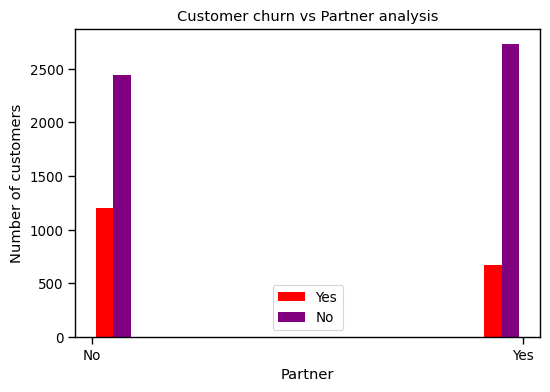

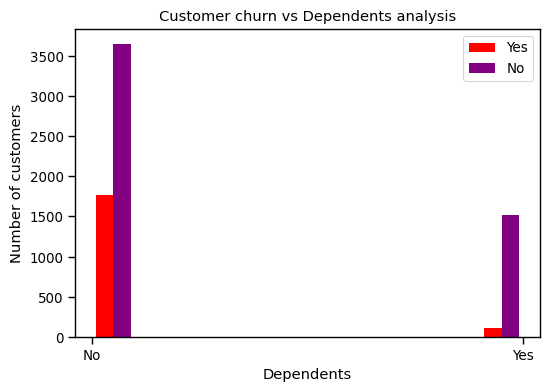

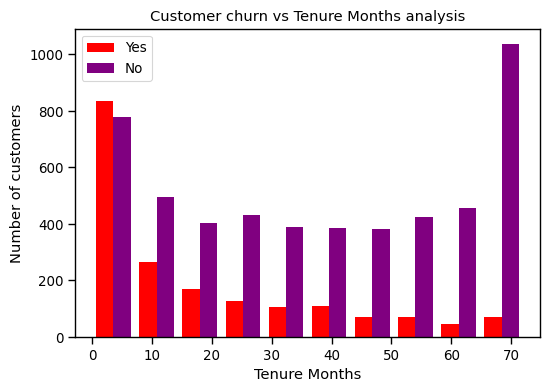

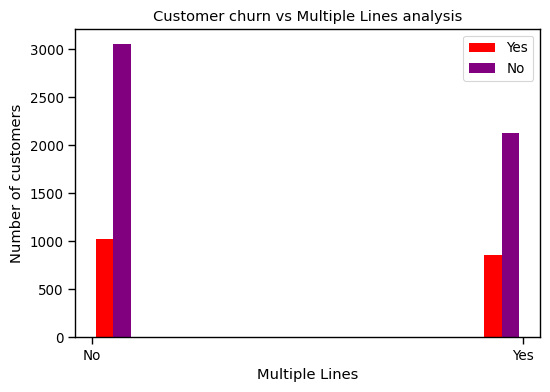

...

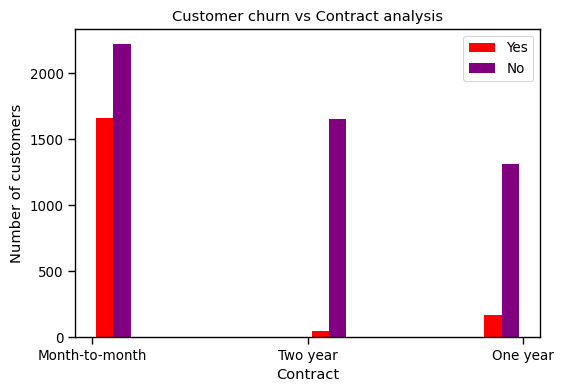

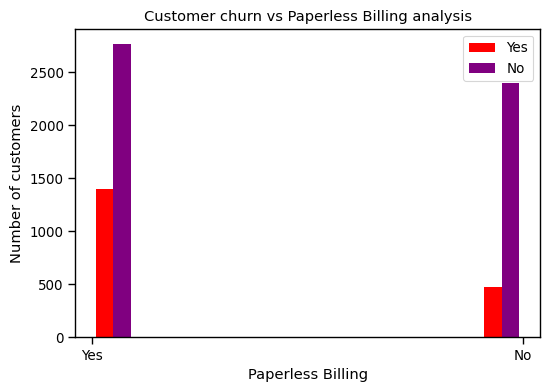

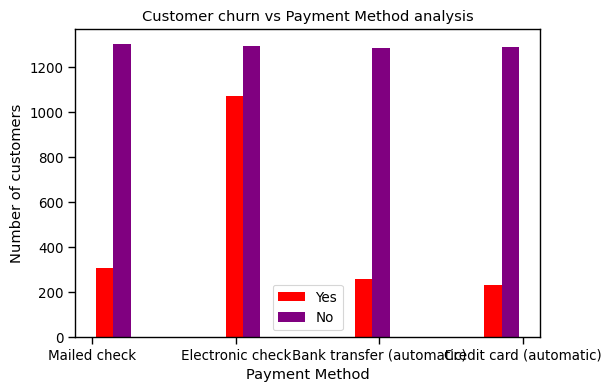

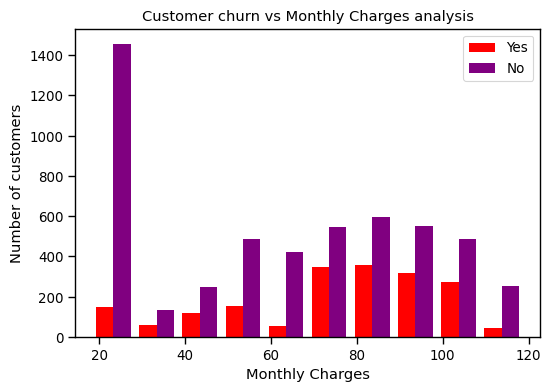

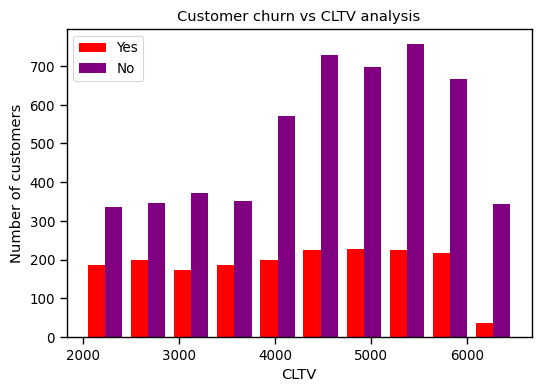

In [52]:
# Customer churn vs other features

if showViz == 1:
    for column in df.drop('Churn', axis=1):
      churnHist(column)

### Encoding

In [53]:
# Show categorical unique values
showUniqueValues(df)

Senior Citizen : ['No' 'Yes']
Partner : ['No' 'Yes']
Dependents : ['No' 'Yes']
Multiple Lines : ['No' 'Yes']
Internet Service : ['DSL' 'Fiber optic' 'No']
Online Security : ['Yes' 'No']
Online Backup : ['Yes' 'No']
Device Protection : ['No' 'Yes']
Tech Support : ['No' 'Yes']
Streaming TV : ['No' 'Yes']
Streaming Movies : ['No' 'Yes']
Contract : ['Month-to-month' 'Two year' 'One year']
Paperless Billing : ['Yes' 'No']
Payment Method : ['Mailed check' 'Electronic check' 'Bank transfer (automatic)'
 'Credit card (automatic)']


#### Encoding Type 1 : Label encoding

In [54]:
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder()

labelEncodedColumns = ['Senior Citizen','Partner','Dependents','Multiple Lines','Online Security',
                       'Online Backup','Device Protection','Tech Support','Streaming TV','Streaming Movies',
                       'Contract','Paperless Billing']

def labelEncoding(df):
    
    # Loop to do label encoding
    for col in labelEncodedColumns:
        df[col]= label_encoder.fit_transform(df[col])  

    return df

In [55]:
labelEncoding(df)

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Churn,CLTV
0,0,0,0,2,0,DSL,1,1,0,0,0,0,0,1,Mailed check,53.85,1,3239
1,0,0,1,2,0,Fiber optic,0,0,0,0,0,0,0,1,Electronic check,70.70,1,2701
2,0,0,1,8,1,Fiber optic,0,0,1,0,1,1,0,1,Electronic check,99.65,1,5372
3,0,1,1,28,1,Fiber optic,0,0,1,1,1,1,0,1,Electronic check,104.80,1,5003
4,0,0,1,49,1,Fiber optic,0,1,1,0,1,1,0,1,Bank transfer (automatic),103.70,1,5340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,0,0,72,0,No,0,0,0,0,0,0,2,1,Bank transfer (automatic),21.15,0,5306
7039,0,1,1,24,1,DSL,1,0,1,1,1,1,1,1,Mailed check,84.80,0,2140
7040,0,1,1,72,1,Fiber optic,0,1,1,0,1,1,1,1,Credit card (automatic),103.20,0,5560
7041,0,1,1,11,0,DSL,1,0,0,0,0,0,0,1,Electronic check,29.60,0,2793


In [56]:
# Show categorical unique values
showUniqueValues(df)

Internet Service : ['DSL' 'Fiber optic' 'No']
Payment Method : ['Mailed check' 'Electronic check' 'Bank transfer (automatic)'
 'Credit card (automatic)']


In [57]:
# Check shape of the dataframe
df.shape

(7043, 18)

In [58]:
for c in labelEncodedColumns:
    print(f'{c} : ', df[c].unique())

Senior Citizen :  [0 1]
Partner :  [0 1]
Dependents :  [0 1]
Multiple Lines :  [0 1]
Online Security :  [1 0]
Online Backup :  [1 0]
Device Protection :  [0 1]
Tech Support :  [0 1]
Streaming TV :  [0 1]
Streaming Movies :  [0 1]
Contract :  [0 2 1]
Paperless Billing :  [1 0]


#### Encoding Type 2 : One hot encoding

In [59]:
def oneHotEncoding(df):
    # One hot encoding is done to the relevant columns at once.
    df = pd.get_dummies(data=df, columns=['Internet Service', 'Payment Method'], dtype=float)
    return df

df = oneHotEncoding(df)

In [60]:
# Check shape of the dataframe
df.shape

(7043, 23)

In [61]:
# View the dataframe
df

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,...,Monthly Charges,Churn,CLTV,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check
0,0,0,0,2,0,1,1,0,0,0,...,53.85,1,3239,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,0,1,2,0,0,0,0,0,0,...,70.70,1,2701,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0,0,1,8,1,0,0,1,0,1,...,99.65,1,5372,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0,1,1,28,1,0,0,1,1,1,...,104.80,1,5003,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0,0,1,49,1,0,1,1,0,1,...,103.70,1,5340,0.0,1.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,0,0,72,0,0,0,0,0,0,...,21.15,0,5306,0.0,0.0,1.0,1.0,0.0,0.0,0.0
7039,0,1,1,24,1,1,0,1,1,1,...,84.80,0,2140,1.0,0.0,0.0,0.0,0.0,0.0,1.0
7040,0,1,1,72,1,0,1,1,0,1,...,103.20,0,5560,0.0,1.0,0.0,0.0,1.0,0.0,0.0
7041,0,1,1,11,0,1,0,0,0,0,...,29.60,0,2793,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [62]:
# Show unique values of the columns
showUniqueValues(df)

In [63]:
# Get the column names
colNames.clear()
for column in df:
    colNames.append(column)

In [64]:
# Show some statistics

df.describe()

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,...,Monthly Charges,Churn,CLTV,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,...,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.162147,0.483033,0.231010,32.371149,0.421837,0.286668,0.344881,0.343888,0.290217,0.384353,...,64.761692,0.265370,4400.295755,0.343746,0.439585,0.216669,0.219225,0.216101,0.335794,0.228880
std,0.368612,0.499748,0.421508,24.559481,0.493888,0.452237,0.475363,0.475038,0.453895,0.486477,...,30.090047,0.441561,1183.057152,0.474991,0.496372,0.412004,0.413751,0.411613,0.472301,0.420141
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,18.250000,0.000000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,35.500000,0.000000,3469.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,70.350000,0.000000,4527.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,55.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,89.850000,1.000000,5380.500000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,72.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,118.750000,1.000000,6500.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [65]:
df['Churn'].value_counts()

Churn
0    5174
1    1869
Name: count, dtype: int64

In [66]:
len(colNames)

23

### Treating Outliers

#### Function to visualize outliers

In [67]:
# Boxplots
# Since the number of features is 73, the boxplots are grouped as 5 features per group.
import math

def showBoxplots2():
    
  l1 = []
  j = 0

  for i in range(math.ceil(len(colNames)/20)):
    l1.append(colNames[i*20:(i+1)*20])
    #df.boxplot(column=colNames[i*5:(i+1)*5])

  for i in l1:
    j = j + 1
    fig = plt.subplots()
    b_plot = df.boxplot(column=i, vert=False)
    #df.T.boxplot(vert=False)
    #plt.subplots_adjust(left=0.25)
    b_plot.plot()
    #plt.xticks(rotation=90)
    plt.savefig(f'boxplots/{j}.png', dpi=100);
    plt.show()
    print('\n')

In [68]:
def showBoxplots(title):
    
    fig = plt.subplots(figsize=(10, 8))
    b_plot = df.drop('Churn', axis=1).boxplot(vert=False)
    b_plot.plot()
    plt.title(f'Boxplots - {title}', fontsize = 16, weight = 'extra bold')
    #plt.savefig(f'Boxplots - {title}.png', dpi=200);
    plt.show()

#### Show boxplots - Before treating outliers

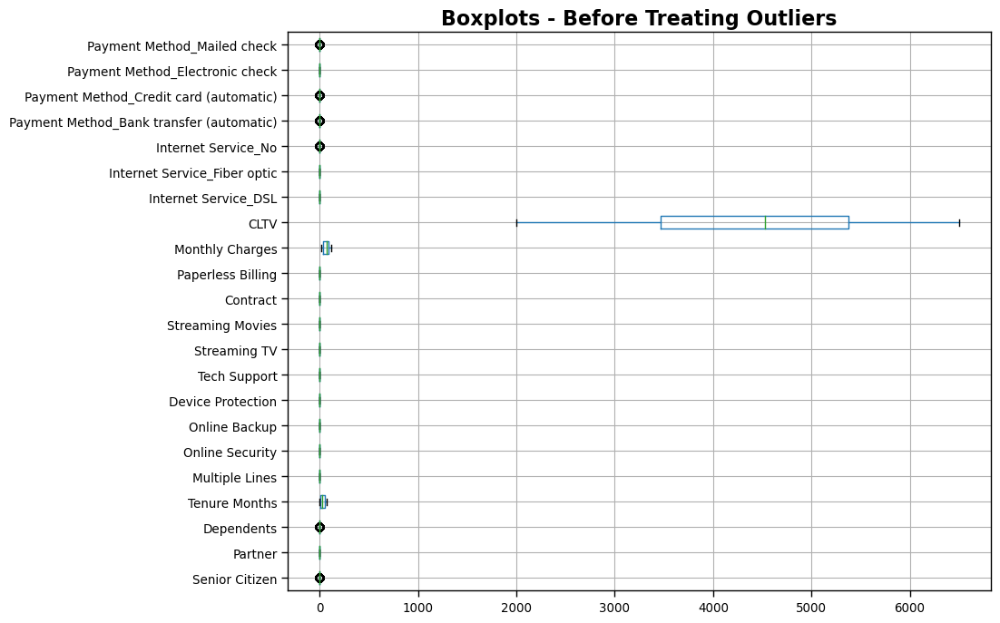

In [69]:
if showViz == 1:
    showBoxplots('Before Treating Outliers')

In [70]:
df.dtypes

Senior Citizen                                int64
Partner                                       int64
Dependents                                    int64
Tenure Months                                 int64
Multiple Lines                                int64
Online Security                               int64
Online Backup                                 int64
Device Protection                             int64
Tech Support                                  int64
Streaming TV                                  int64
Streaming Movies                              int64
Contract                                      int64
Paperless Billing                             int64
Monthly Charges                             float64
Churn                                         int64
CLTV                                          int64
Internet Service_DSL                        float64
Internet Service_Fiber optic                float64
Internet Service_No                         float64
Payment Meth

#### Removing outliers

The outliers are replaced with the median
In does not display having outliers in this dataset.

In [71]:
colNames.remove('Churn')

for column in colNames:

    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)

    iqr = q3 - q1
    upperLevel = q3 + (iqr * 1.5)
    lowerLevel = q1 - (iqr * 1.5)

    df[column][df[column] < lowerLevel] = df[column][df[column] > upperLevel] = df[column].median()

/var/folders/kr/26ckztk90nndnzrcxhyjjwzm0000gn/T/ipykernel_1571/545991010.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kr/26ckztk90nndnzrcxhyjjwzm0000gn/T/ipykernel_1571/545991010.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kr/26ckztk90nndnzrcxhyjjwzm0000gn/T/ipykernel_1571/545991010.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kr/26ckztk90nndnzrcxhyjjwzm0000gn/T/ipykernel

#### Show boxplots - After treating outliers

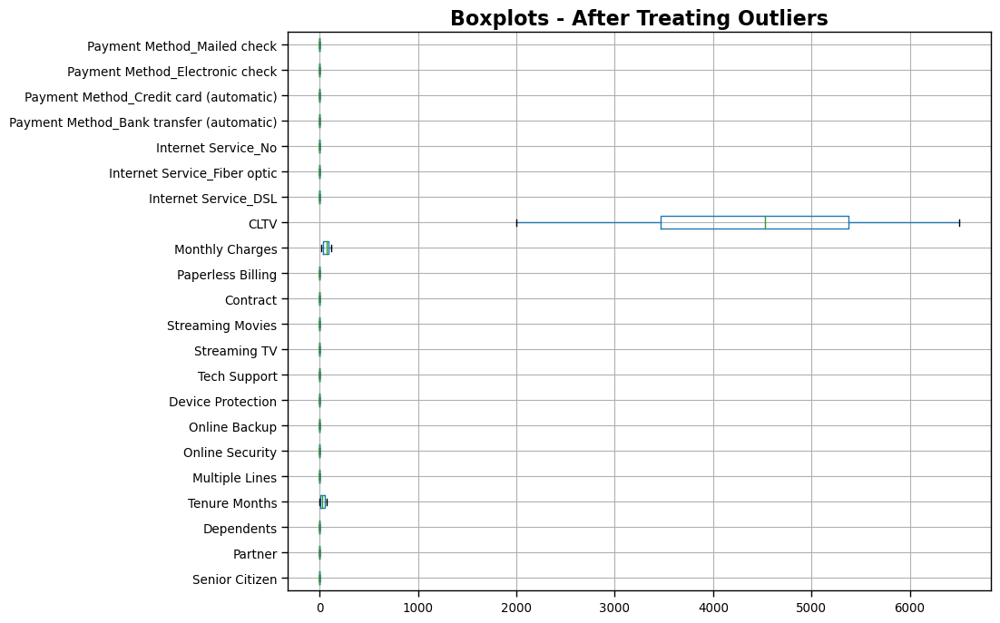

In [72]:
if showViz == 1:
    showBoxplots('After Treating Outliers')

In [73]:
df.dtypes

Senior Citizen                                int64
Partner                                       int64
Dependents                                    int64
Tenure Months                                 int64
Multiple Lines                                int64
Online Security                               int64
Online Backup                                 int64
Device Protection                             int64
Tech Support                                  int64
Streaming TV                                  int64
Streaming Movies                              int64
Contract                                      int64
Paperless Billing                             int64
Monthly Charges                             float64
Churn                                         int64
CLTV                                          int64
Internet Service_DSL                        float64
Internet Service_Fiber optic                float64
Internet Service_No                         float64
Payment Meth

### Lasso Coefficient

#### Function to generate lasso coefficient plot

In [74]:
from sklearn.linear_model import Lasso

def lassoCoefficientGraph():
    
    # Create a Lasso regression model with a specific alpha (regularization strength)
    lasso_model = Lasso(alpha=1.0)

    lasso_model.fit(df, df['Churn'])

    # Access the Lasso coefficients
    lasso_coefficients = lasso_model.coef_
    
    fig, ax = plt.subplots(figsize=(30, 10))

    ax.bar(df.columns, lasso_coefficients)
    ax.set(title='Lasso Coefficient Graph', xlabel='Features', ylabel='')
    
    ax.grid(True)
    plt.xticks(rotation=70);

#### Lasso coefficient graph

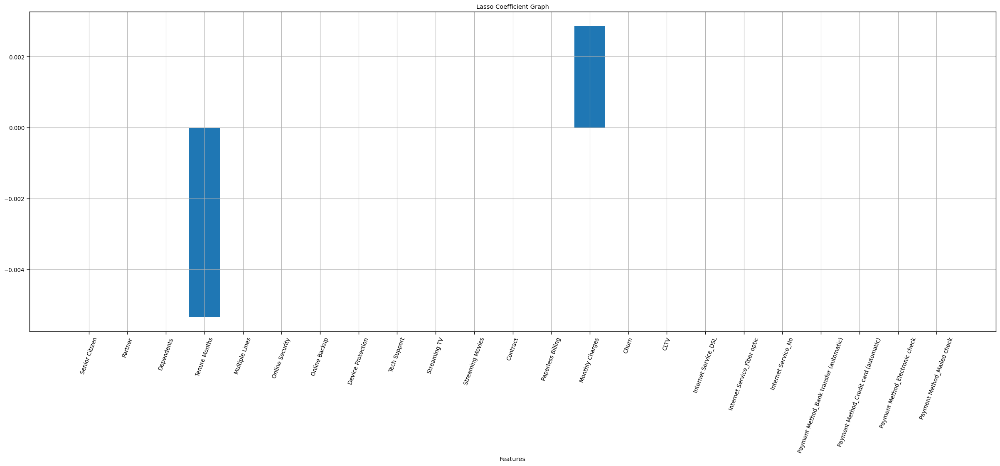

In [75]:
lassoCoefficientGraph()

### Pearson Correlation Coefficient

In [76]:
# List of categoricals
categoricals = list()
for x in df.columns:
    if df[x].dtype == 'object':
        categoricals.append(x)
df[categoricals].nunique()

Series([], dtype: float64)

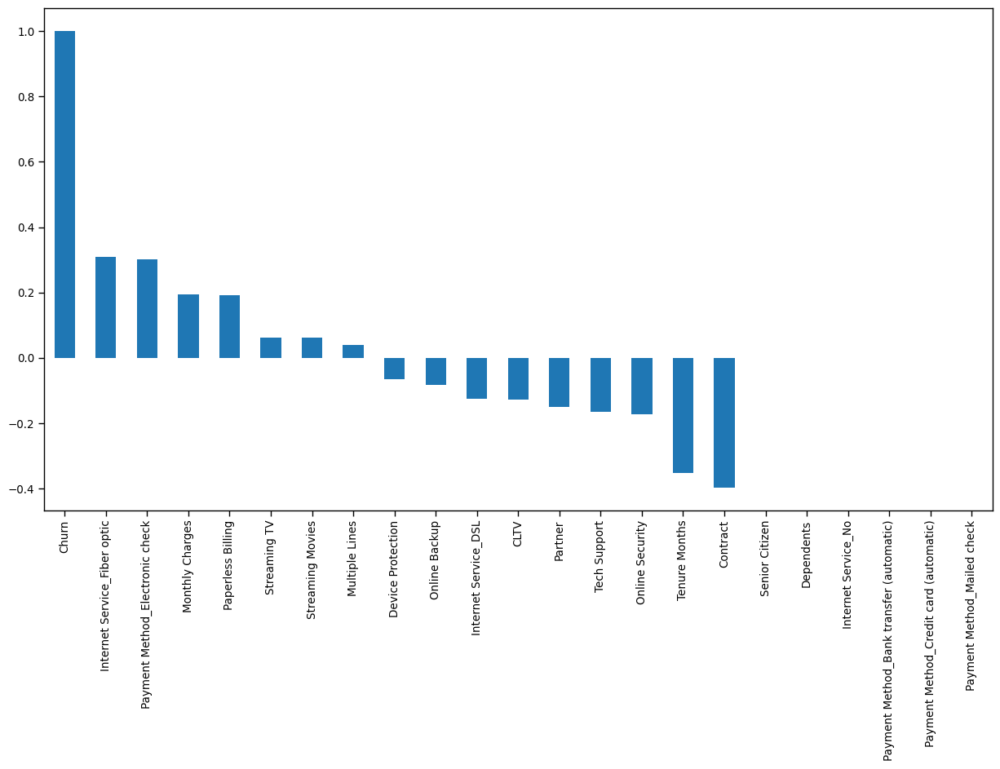

In [77]:
numericals = [x for x in df.columns if x not in categoricals]

plt.figure(figsize=(15,8))
df[numericals].corr(method='pearson')['Churn'].sort_values(ascending = False).plot(kind='bar');

## < Feature Engineering >

### Scaling

In [78]:
# Check for features with type 'object'

for column in df:
  if df[column].dtype =='object':
    print(column)

#### Min_Max scaler

In [79]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

In [80]:
def minMaxScale(df):
    # Get all the column names to a list.
    colNames = df.columns.tolist()[0:len(df.columns.tolist())]

    # Apply Min-Max scaler
    df[colNames] = scaler.fit_transform(df[colNames])

#### Apply Min-Max scaler

In [81]:
# Call min-max scaling function
minMaxScale(df)

# View sample
df.sample(5)

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,...,Monthly Charges,Churn,CLTV,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check
94,0.0,0.0,0.0,0.069444,0.0,0.0,0.0,1.0,0.0,1.0,...,0.778607,1.0,0.751612,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2658,0.0,0.0,0.0,0.277778,0.0,1.0,0.0,0.0,1.0,0.0,...,0.355721,0.0,0.686458,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4964,0.0,1.0,0.0,0.972222,1.0,0.0,0.0,0.0,0.0,0.0,...,0.057711,0.0,0.604625,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5691,0.0,0.0,0.0,0.944444,0.0,1.0,1.0,1.0,1.0,1.0,...,0.458706,0.0,0.476540,1.0,0.0,0.0,0.0,0.0,0.0,0.0
590,0.0,1.0,0.0,0.013889,1.0,1.0,0.0,1.0,0.0,1.0,...,0.837811,1.0,0.624416,0.0,1.0,0.0,0.0,0.0,1.0,0.0


###### Show some statistics

In [82]:
df.describe()

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,...,Monthly Charges,Churn,CLTV,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check
count,7043.0,7043.000000,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,...,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.0,7043.0,7043.0,7043.000000,7043.0
mean,0.0,0.483033,0.0,0.449599,0.421837,0.286668,0.344881,0.343888,0.290217,0.384353,...,0.462803,0.265370,0.533088,0.343746,0.439585,0.0,0.0,0.0,0.335794,0.0
std,0.0,0.499748,0.0,0.341104,0.493888,0.452237,0.475363,0.475038,0.453895,0.486477,...,0.299403,0.441561,0.263077,0.474991,0.496372,0.0,0.0,0.0,0.472301,0.0
min,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0
25%,0.0,0.000000,0.0,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.171642,0.000000,0.325995,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0
50%,0.0,0.000000,0.0,0.402778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.518408,0.000000,0.561263,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0
75%,0.0,1.000000,0.0,0.763889,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.712438,1.000000,0.751056,1.000000,1.000000,0.0,0.0,0.0,1.000000,0.0
max,0.0,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0,0.0,1.000000,0.0


#### Show boxplots - After scaling

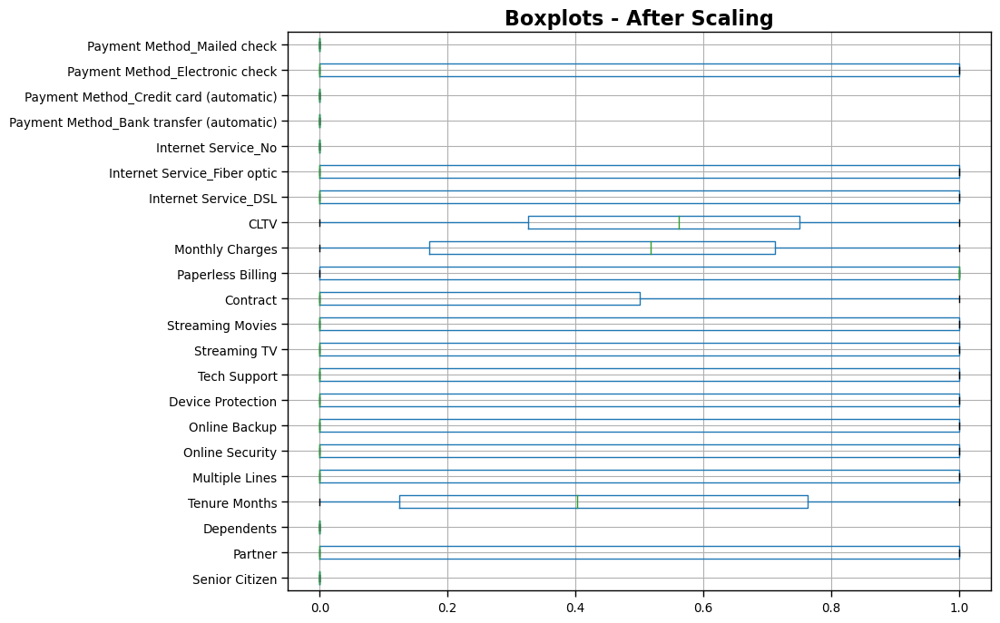

In [83]:
if showViz == 1:
    showBoxplots('After Scaling')

In [84]:
df.columns

Index(['Senior Citizen', 'Partner', 'Dependents', 'Tenure Months',
       'Multiple Lines', 'Online Security', 'Online Backup',
       'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies',
       'Contract', 'Paperless Billing', 'Monthly Charges', 'Churn', 'CLTV',
       'Internet Service_DSL', 'Internet Service_Fiber optic',
       'Internet Service_No', 'Payment Method_Bank transfer (automatic)',
       'Payment Method_Credit card (automatic)',
       'Payment Method_Electronic check', 'Payment Method_Mailed check'],
      dtype='object')

### The boxplots generated after feature scaling indicates the distribution of some features are very low and near to zero. To make more sense of these columns, the first model is training process is done with all the columns.

## < Data Splitting >

### Train & Test Splits


In [85]:
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report
from sklearn.model_selection import train_test_split

X_train = X_test = df.drop(df.index)
y_train = y_test = df.drop(df.index)

def splitDataset(df):
    # All the columns except 'Churn'
    X = df.drop('Churn', axis=1)

    # 'Churn' column
    y = df['Churn']

    # Access dataframes declared globaly
    global X_train, X_test, y_train, y_test
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [86]:
splitDataset(df)

In [87]:
X_train.shape

(5634, 22)

In [88]:
X_test.shape

(1409, 22)

In [89]:
y_train.shape

(5634,)

In [90]:
y_test.shape

(1409,)

In [91]:
X_train

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,...,Paperless Billing,Monthly Charges,CLTV,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check
5860,0.0,1.0,0.0,0.847222,1.0,0.0,1.0,0.0,1.0,0.0,...,1.0,0.669652,0.631977,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2458,0.0,0.0,0.0,0.875000,0.0,1.0,1.0,0.0,1.0,0.0,...,1.0,0.222388,0.979097,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5879,0.0,0.0,0.0,0.013889,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.360697,0.523905,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4708,0.0,0.0,0.0,0.069444,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.023881,0.799199,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1293,0.0,0.0,0.0,0.361111,1.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.797015,0.665777,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,0.0,1.0,0.0,0.027778,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.518408,0.647988,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1725,0.0,0.0,0.0,0.680556,1.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.819403,0.796531,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4079,0.0,1.0,0.0,1.000000,1.0,1.0,1.0,1.0,0.0,1.0,...,1.0,0.909453,0.929064,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2254,0.0,0.0,0.0,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.017910,0.665555,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [92]:
X_test

,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,...,Paperless Billing,Monthly Charges,CLTV,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check
4213,0.0,1.0,0.0,0.708333,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.072139,0.765844,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5035,0.0,1.0,0.0,0.930556,0.0,1.0,1.0,0.0,1.0,0.0,...,1.0,0.424876,0.842562,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3713,0.0,1.0,0.0,0.527778,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.019900,0.535468,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1720,0.0,0.0,0.0,0.402778,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.068159,0.176340,1.0,0.0,0.0,0.0,0.0,0.0,0.0
234,0.0,0.0,0.0,0.041667,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.608458,0.333111,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1207,0.0,0.0,0.0,0.750000,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.609453,0.818546,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3809,0.0,0.0,0.0,0.027778,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.619900,0.743384,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6196,0.0,1.0,0.0,0.194444,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.014428,0.214143,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6092,0.0,0.0,0.0,0.527778,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.019403,0.654659,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [93]:
y_train

5860    0.0
2458    0.0
5879    0.0
4708    0.0
1293    1.0
       ... 
3046    0.0
1725    1.0
4079    0.0
2254    0.0
2915    0.0
Name: Churn, Length: 5634, dtype: float64

In [94]:
y_test

4213    0.0
5035    0.0
3713    0.0
1720    1.0
234     1.0
       ... 
1207    1.0
3809    0.0
6196    0.0
6092    0.0
5635    0.0
Name: Churn, Length: 1409, dtype: float64

## < Model Selection >

The below supervised learning machine learning algorithms are used to analyze the customer churn dataset.

- #### K-Nearest Neighbors (KNN)
- #### Support Vector Machine (SVM)
- #### Random Forest
- #### Logistic Regression
- #### Decision Tree Classifier
- #### Ada Boost Classifier
- #### Gradient Boosting Classifier
- #### Voting Classifier

### Customized functions used to calculate important parameters for ML selection

#### Calculating and storing the duration spent for ML processes

In [95]:
# DataFrame to select the appropriate ML algorithm for this customer churn prediction dataset
df_ml_eval = pd.DataFrame({'ATTEMPT':[], 'ALGORITHM':[], 'TIME':[]})

attempt = 0

algoList = ['KNN', 'SVM', 'Random Forest', 'Logistic Regression', 'Decision Tree', 'Ada Boost', 'Gradient Boosting', 'Voting']

# Function to calculate ML processing time and results, and store records in the 'dfTimeML' DataFrame for analysis
def calculateTimeML(t, nameML=None, accuracy=None):
  global startTime
  global endTime

  if t == 1:
     startTime = datetime.now()
  elif t == 2:
     endTime = datetime.now()


     # Print duration
     print(f'{nameML} time : {(endTime-startTime).total_seconds()}')

     # Store time in the DataFrame
     df_ml_eval.loc[len(df_ml_eval.index)+1] = [attempt, nameML, (endTime-startTime).total_seconds()]

#### Function to generate Confusion Matrix Graph

In [96]:
def generateConfusionMatrixGraph(algo, y_test, pred, attempt):

    fig, ax = plt.subplots(figsize=(4,3))
    sns.heatmap(confusion_matrix(y_test, pred, labels=[0, 1]), cmap="Blues",
                    annot=True,fmt = "d",linecolor="k",linewidths=3)

    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set(title=f'{algo} Confusion Matrix')
    
    plt.savefig(f'Confusion Matrix {attempt} - {algo}.png', dpi=200)
        
    plt.show()

#### Function to generate Confusion Matrix Array

In [97]:
def generateConfusionMatrixArray(prediction):
    # Assigned the actual and predicted values to a dictionary.
    dvalues = {'y_actual': y_test, 'y_predicted': prediction}

    # Create a dataframe from dvalues dictionary.
    dfcm = pd.DataFrame(dvalues)

    # Create the confusion matrix using the dfcm dataframe.
    cm = pd.crosstab(dfcm['y_actual'], dfcm['y_predicted'], rownames=['Actual'], colnames=['Predicted'])

    return cm

#### Replacing 'Yes' and 'No' values with 1 and 0 in y datasets

In [98]:
def replaceYesNo():
    # Number of model training attempts
    global attempt
    
    attempt = attempt + 1

    # Replacing 'Yes' and 'No' values with 1 and 0 to avoid python errors
    y_test.replace({'Yes':1, 'No':0}, inplace=True)
    y_train.replace({'Yes':1, 'No':0}, inplace=True)

replaceYesNo()

## < Model Training >

### 01 : K-Nearest Neighbors (KNN)

In [99]:
from sklearn.neighbors import KNeighborsClassifier

def trainModel_knn():
    
    calculateTimeML(1)

    model_knn = KNeighborsClassifier(n_neighbors = 11)
    model_knn.fit(X_train,y_train)
    prediction_knn = model_knn.predict(X_test)
    accuracy_knn = model_knn.score(X_test,y_test)
    print("KNN accuracy :",accuracy_knn)

    calculateTimeML(2, 'KNN', accuracy_knn)

    print('\nClassification Report')
    print(classification_report(y_test, prediction_knn))
    
    return (model_knn, prediction_knn)

### 02 : Support Vector Machine - SVM

##### Since the Support Vector Machine takes a considerable amount of time compared to the other algorithms, SVM was not considered in this research form here onwards.

In [100]:
from sklearn.svm import SVC

def trainModel_svc():
    
    calculateTimeML(1)

    model_svc = SVC(random_state = 1, probability=True)
    model_svc.fit(X_train,y_train)
    prediction_svc = model_svc.predict(X_test)
    accuracy_svc = model_svc.score(X_test,y_test)
    print('SVM accuracy :',accuracy_svc)

    calculateTimeML(2, 'SVM', accuracy_svc)

    print('\nClassification Report')
    print(classification_report(y_test, prediction_svc))

    return (model_svc, prediction_svc)

### 03 : Random Forest


In [101]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

def trainModel_rf():
    calculateTimeML(1)

    model_rf = RandomForestClassifier(n_estimators=500 , oob_score = True, n_jobs = -1,
                                      random_state =50, max_features = "sqrt",
                                      max_leaf_nodes = 30)
    model_rf.fit(X_train, y_train)
    prediction_rf = model_rf.predict(X_test)
    accuracy_rf = metrics.accuracy_score(y_test, prediction_rf)
    print('Random Forest accuracy :', accuracy_rf)

    calculateTimeML(2, 'Random Forest', accuracy_rf)

    print("\nClassification Report")
    print(classification_report(y_test, prediction_rf))
    
    return (model_rf, prediction_rf)

###  04 : Logistic Regression


In [102]:
from sklearn.linear_model import LogisticRegression

def trainModel_lr():
    calculateTimeML(1)

    model_lr = LogisticRegression()
    model_lr.fit(X_train,y_train)
    prediction_lr = model_lr.predict(X_test)
    accuracy_lr = model_lr.score(X_test,y_test)
    print("Logistic Regression accuracy :",accuracy_lr)

    calculateTimeML(2, 'Logistic Regression', accuracy_lr)

    print("\nClassification Report")
    print(classification_report(y_test,prediction_lr))
    
    return (model_lr, prediction_lr)

### 05 : Decision Tree Classifier


In [103]:
from sklearn.tree import DecisionTreeClassifier

def trainModel_dt():

    calculateTimeML(1)

    model_dt = DecisionTreeClassifier()
    model_dt.fit(X_train,y_train)
    prediction_dt = model_dt.predict(X_test)
    accuracy_dt = model_dt.score(X_test,y_test)
    print("Decision Tree accuracy is :",accuracy_dt)

    calculateTimeML(2, 'Decision Tree', accuracy_dt)

    print('\nClassification Report')
    print(classification_report(y_test, prediction_dt))
    
    return (model_dt, prediction_dt)

### 06 : Ada Boost Classifier


In [104]:
from sklearn.ensemble import AdaBoostClassifier

def trainModel_abc():

    calculateTimeML(1)

    model_abc = AdaBoostClassifier()
    model_abc.fit(X_train,y_train)
    prediction_abc = model_abc.predict(X_test)
    accuracy_abc = metrics.accuracy_score(y_test, prediction_abc)
    print("Ada Boost Classifier accuracy : ", accuracy_abc)

    calculateTimeML(2, 'Ada Boost', accuracy_abc)

    print('\nClassificatin Report')
    print(classification_report(y_test, prediction_abc))
    
    return (model_abc, prediction_abc)

### 07 : Gradient Boosting Classifier


In [105]:
from sklearn.ensemble import GradientBoostingClassifier

def trainModel_gbc():
    calculateTimeML(1)

    model_gbc = GradientBoostingClassifier()
    model_gbc.fit(X_train, y_train)
    prediction_gbc = model_gbc.predict(X_test)
    accuracy_gbc = accuracy_score(y_test, prediction_gbc)
    print("Gradient Boosting Classifier : ", accuracy_gbc)

    calculateTimeML(2, 'Gradient Boosting', accuracy_gbc)

    print('\nClassification Report')
    print(classification_report(y_test, prediction_gbc))
    
    return (model_gbc, prediction_gbc)

### 08 : Voting Classifier


In [106]:
from sklearn.ensemble import VotingClassifier

def trainModel_vc():

    calculateTimeML(1)

    clf_gbc = GradientBoostingClassifier()
    clf_lr = LogisticRegression()
    clf_abc = AdaBoostClassifier()
    model_vc = VotingClassifier(estimators=[('gbc', clf_gbc), ('lr', clf_lr), ('abc', clf_abc)], voting='soft')
    model_vc.fit(X_train, y_train)
    prediction_vc = model_vc.predict(X_test)
    accuracy_vc = accuracy_score(y_test, prediction_vc)
    print(f"Final Accuracy Score {accuracy_vc}")

    calculateTimeML(2, 'Voting', accuracy_vc)

    print('\nClassification Report')
    print(classification_report(y_test, prediction_vc))
    
    return (model_vc, prediction_vc)

#### Function to run model training

In [107]:
def runModelTrainFunctions():
    
    model_knn, prediction_knn = trainModel_knn()
    model_svc, prediction_svc = trainModel_svc()
    model_rf, prediction_rf = trainModel_rf()
    model_lr, prediction_lr = trainModel_lr()
    model_dt, prediction_dt = trainModel_dt()
    model_abc, prediction_abc = trainModel_abc()
    model_gbc, prediction_gbc = trainModel_gbc()
    model_vc, prediction_vc = trainModel_vc()
    
    return model_knn, model_svc, model_rf, model_lr, model_dt, model_abc, model_gbc, model_vc, prediction_knn, prediction_svc, prediction_lr, prediction_rf, prediction_dt, prediction_abc, prediction_gbc, prediction_vc


#### Calling models training function

In [108]:
model_knn, model_svc, model_rf, model_lr, model_dt, model_abc, model_gbc, model_vc, prediction_knn, prediction_svc, prediction_lr, prediction_rf, prediction_dt, prediction_abc, prediction_gbc,prediction_vc = runModelTrainFunctions()

KNN accuracy : 0.7764371894960965
KNN time : 0.705539

Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.86      0.85      1042
         1.0       0.58      0.53      0.55       367

    accuracy                           0.78      1409
   macro avg       0.71      0.70      0.70      1409
weighted avg       0.77      0.78      0.77      1409

SVM accuracy : 0.7998580553584103
SVM time : 5.785718

Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1042
         1.0       0.65      0.51      0.57       367

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409

Random Forest accuracy : 0.7991483321504613
Random Forest time : 1.319293

Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.92      0

#### The total processing time

In [109]:
print(f'Total processing time : {(endTime-mainStartTime)}')

Total processing time : 0:01:09.676259


In [110]:
df_ml_eval

,ATTEMPT,ALGORITHM,TIME
1,1,KNN,0.705539
2,1,SVM,5.785718
3,1,Random Forest,1.319293
4,1,Logistic Regression,0.457759
5,1,Decision Tree,0.023770
6,1,Ada Boost,0.253946
7,1,Gradient Boosting,0.641061
8,1,Voting,0.793611


## < Model Evaluation >

### Evaluation Type 1 - Confusion Matrix

#### Function to generate confusion matrix graphs

In [111]:
def generateConfusionMatrixGraphs_All(attempt):
    
    generateConfusionMatrixGraph('KNN', y_test, prediction_knn, attempt)
    generateConfusionMatrixGraph('SVM', y_test, prediction_svc, attempt)
    generateConfusionMatrixGraph('Random Forest', y_test, prediction_rf, attempt)
    generateConfusionMatrixGraph('Logistic Regression', y_test, prediction_lr, attempt)
    generateConfusionMatrixGraph('Decision Tree', y_test, prediction_dt, attempt)
    generateConfusionMatrixGraph('Ada Boost', y_test, prediction_abc, attempt)
    generateConfusionMatrixGraph('Gradient Boosting Classifier', y_test, prediction_gbc, attempt)
    generateConfusionMatrixGraph('VC Classifier', y_test, prediction_vc, attempt)   

#### Generate Confusion Matrix graphs

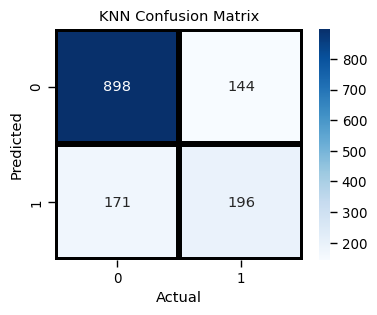

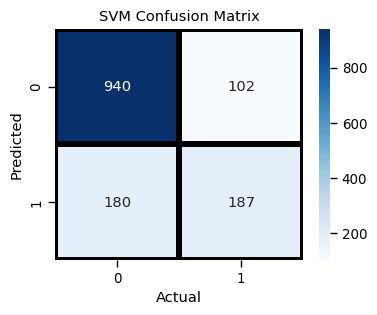

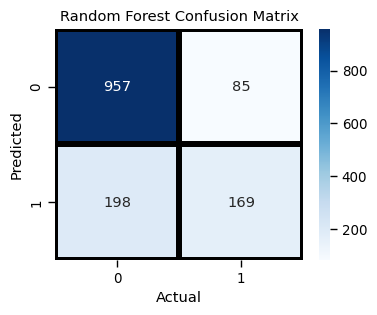

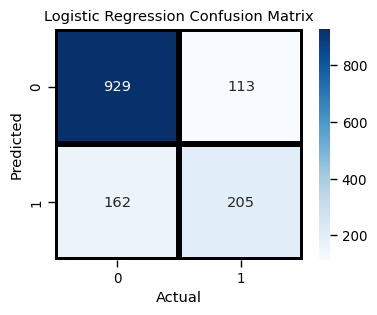

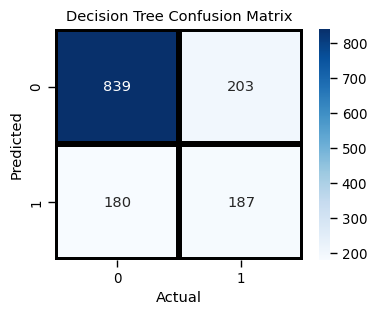

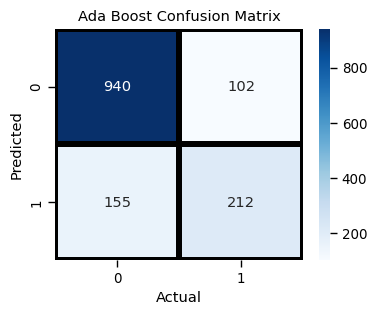

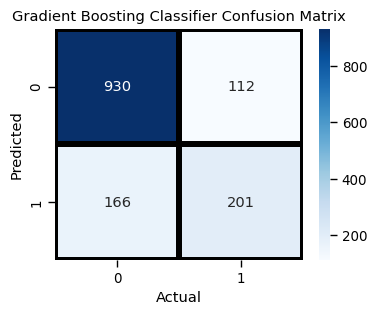

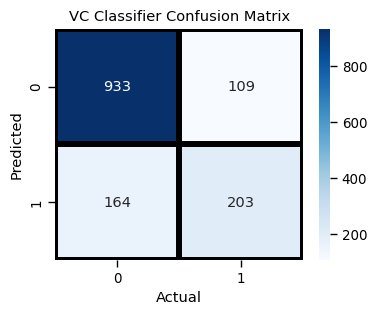

In [112]:
if showViz == 1:
    generateConfusionMatrixGraphs_All(attempt) 

#### Function to create Confusion Matrix Arrays - Accuracy, Sensivity, Specificity, Recall & F1_Score

In [113]:
# Confusion Matrix Arrays of each ML model

def confusionMatrixArrays():   
        
        # K-Nearest Neighbors
        cm_knn = generateConfusionMatrixArray(prediction_knn)

        # Support vector machine
        cm_svc = generateConfusionMatrixArray(prediction_svc)
        
        # Random forest
        cm_rf = generateConfusionMatrixArray(prediction_rf)
        
        # Logistic regression
        cm_lr = generateConfusionMatrixArray(prediction_lr)

        # Decision tree
        cm_dt = generateConfusionMatrixArray(prediction_dt)

        # Ada boost
        cm_abc = generateConfusionMatrixArray(prediction_abc)

        # Gradient boosting
        cm_gbc = generateConfusionMatrixArray(prediction_gbc)

        # Voting
        cm_vc = generateConfusionMatrixArray(prediction_vc)

        return (cm_knn, cm_svc, cm_rf, cm_lr, cm_dt, cm_abc, cm_gbc, cm_vc)

#### Call function to create Confusion Matrix Arrays - Accuracy, Sensivity, Specificity, Recall & F1_Score

In [114]:
cm_knn, cm_svc, cm_rf, cm_lr, cm_dt, cm_abc, cm_gbc, cm_vc = confusionMatrixArrays()

#### Function to append 'df_ml_eval' DataFrame with sensivity and specificity data

In [115]:
def appendConfusionMatrixResults():
    
    df_ml_eval['TP'] = [cm_knn[0][0], cm_svc[0][0], cm_rf[0][0], cm_lr[0][0], cm_dt[0][0], cm_abc[0][0], cm_gbc[0][0], cm_vc[0][0]]
    df_ml_eval['TN'] = [cm_knn[1][1], cm_svc[1][1], cm_rf[1][1], cm_lr[1][1], cm_dt[1][1], cm_abc[1][1], cm_gbc[1][1], cm_vc[1][1]]
    df_ml_eval['FP'] = [cm_knn[1][0], cm_svc[1][0], cm_rf[1][0], cm_lr[1][0], cm_dt[1][0], cm_abc[1][0], cm_gbc[1][0], cm_vc[1][0]]
    df_ml_eval['FN'] = [cm_knn[0][1], cm_svc[0][1], cm_rf[0][1], cm_lr[0][1], cm_dt[0][1], cm_abc[0][1], cm_gbc[0][1], cm_vc[0][1]]

#### Call function to append 'df_ml_eval' DataFrame with sensivity and specificity data

In [116]:
appendConfusionMatrixResults()

In [117]:
df_ml_eval

,ATTEMPT,ALGORITHM,TIME,TP,TN,FP,FN
1,1,KNN,0.705539,898,196,144,171
2,1,SVM,5.785718,940,187,102,180
3,1,Random Forest,1.319293,957,169,85,198
4,1,Logistic Regression,0.457759,929,205,113,162
5,1,Decision Tree,0.023770,839,187,203,180
6,1,Ada Boost,0.253946,940,212,102,155
7,1,Gradient Boosting,0.641061,930,201,112,166
8,1,Voting,0.793611,933,203,109,164


#### Function to calculating accuracy, sensitivity, specificity, recall & F1_score

In [118]:
def calculateAccSensiSpeciRecallF1Score():

    # The total of predicted positives and predicted negatives of all the predictions
    df_ml_eval['ACCURACY'] = round(((df_ml_eval['TP']+df_ml_eval['TN'])/(df_ml_eval['TP'] + df_ml_eval['TN'] + df_ml_eval['FP']+df_ml_eval['FN'])*100), 2)

    # Precision : Sensitivity - Predicted true positives by predicted total positives
    df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED'] = round((df_ml_eval['TP']/(df_ml_eval['TP']+df_ml_eval['FN']))*100, 2)

    # Precision : Sepcificity - Predicted true negatives by predicted total negatives
    df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED'] = round((df_ml_eval['TN']/(df_ml_eval['TN']+df_ml_eval['FP']))*100, 2)
    
    # Precision
    df_ml_eval['PRECISION'] = round(df_ml_eval['TP'] / (df_ml_eval['TP'] + df_ml_eval['FP']) * 100, 2)

    # F1-Score
    df_ml_eval['F1_SCORE'] = round(((df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED'] * df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED']) / (df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED'] + df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED']))*2, 2)


#### Call function for calculating accuracy, sensitivity, specificity, recall & F1_score

In [119]:
calculateAccSensiSpeciRecallF1Score()

df_ml_eval

,ATTEMPT,ALGORITHM,TIME,TP,TN,FP,FN,ACCURACY,SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED,SPECIFICITY-CHURN_YES_IDENTIFIED,PRECISION,F1_SCORE
1,1,KNN,0.705539,898,196,144,171,77.64,84.00,57.65,86.18,68.37
2,1,SVM,5.785718,940,187,102,180,79.99,83.93,64.71,90.21,73.08
3,1,Random Forest,1.319293,957,169,85,198,79.91,82.86,66.54,91.84,73.81
4,1,Logistic Regression,0.457759,929,205,113,162,80.48,85.15,64.47,89.16,73.38
5,1,Decision Tree,0.023770,839,187,203,180,72.82,82.34,47.95,80.52,60.61
6,1,Ada Boost,0.253946,940,212,102,155,81.76,85.84,67.52,90.21,75.59
7,1,Gradient Boosting,0.641061,930,201,112,166,80.27,84.85,64.22,89.25,73.11
8,1,Voting,0.793611,933,203,109,164,80.62,85.05,65.06,89.54,73.72


#### Function for plotting accuracy, sensitivity, specificity, recall, F1_score & time

In [120]:
def modelComparisionPlot(fName):

    fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5)) = plt.subplots(ncols=2, nrows=3, figsize=(25, 13), sharex=True)
    fig.tight_layout(pad=5.0)

    bar_container0 = ax0.bar(df_ml_eval['ALGORITHM'], df_ml_eval['ACCURACY'])
    ax0.bar_label(bar_container0)
    ax0.scatter(df_ml_eval['ALGORITHM'], df_ml_eval['ACCURACY'])
    ax0.plot(df_ml_eval['ALGORITHM'], df_ml_eval['ACCURACY'])
    ax0.set(title='Accuracy Graph');
    ax0.grid(True)

    bar_container1 = ax1.bar(df_ml_eval['ALGORITHM'], df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED'])
    ax1.bar_label(bar_container1)
    ax1.scatter(df_ml_eval['ALGORITHM'], df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED'])
    ax1.plot(df_ml_eval['ALGORITHM'], df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED'])
    ax1.set(title='Sensitivity Graph - Churn NO Identified' )
    ax1.grid(True)

    bar_container2 = ax2.bar(df_ml_eval['ALGORITHM'], df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED'])
    ax2.bar_label(bar_container2)
    ax2.scatter(df_ml_eval['ALGORITHM'], df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED'])
    ax2.plot(df_ml_eval['ALGORITHM'], df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED'])
    ax2.set(title='Specificity Graph - Churn YES Identified')
    ax2.grid(True)

    bar_container3 = ax3.bar(df_ml_eval['ALGORITHM'], df_ml_eval['PRECISION'])
    ax3.bar_label(bar_container3)
    ax3.scatter(df_ml_eval['ALGORITHM'], df_ml_eval['PRECISION'])
    ax3.plot(df_ml_eval['ALGORITHM'], df_ml_eval['PRECISION'])
    ax3.set(title='Recall Graph')
    ax3.grid(True)

    bar_container4 = ax4.bar(df_ml_eval['ALGORITHM'], df_ml_eval['F1_SCORE'])
    ax4.bar_label(bar_container4)
    ax4.scatter(df_ml_eval['ALGORITHM'], df_ml_eval['F1_SCORE'])
    ax4.plot(df_ml_eval['ALGORITHM'], df_ml_eval['F1_SCORE'])
    ax4.set(title='F1-Score Graph')
    ax4.grid(True)

    bar_container5 = ax5.bar(df_ml_eval['ALGORITHM'], df_ml_eval['TIME'])
    ax5.bar(df_ml_eval['ALGORITHM'], df_ml_eval['TIME'])
    #ax5.bar_label(bar_container1)
    ax5.set(title='Processed Time', xlabel='', ylabel='Time (seconds)')
    ax5.grid(True)
    plt.xticks(rotation=70);

    fig.suptitle(fName, fontsize = 16, weight = 'extra bold', y=1)
    plt.savefig(f'{fName}.png', dpi=100)

#### Call function for plotting accuracy, sensitivity, specificity, recall, F1_score & time

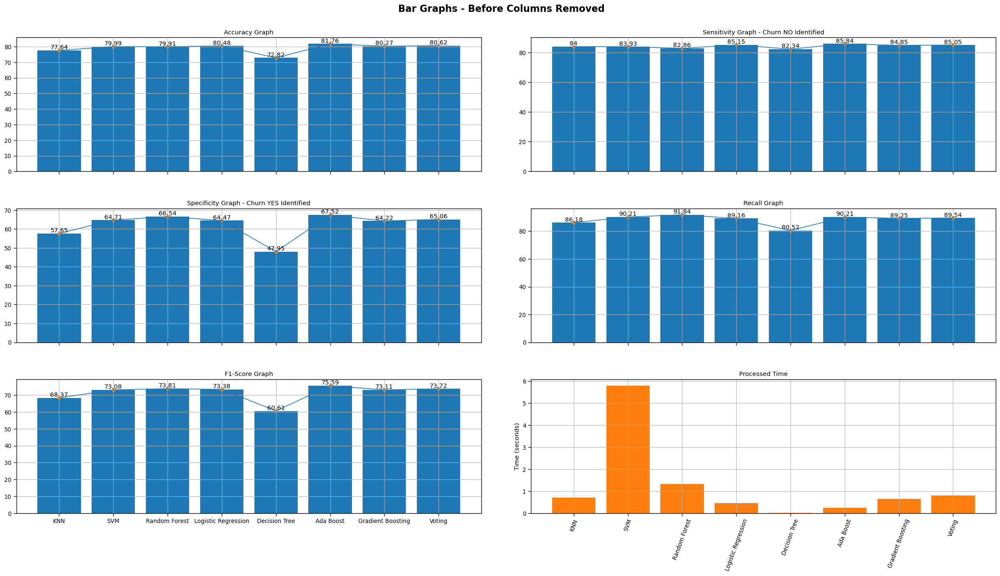

In [121]:
modelComparisionPlot('Bar Graphs - Before Columns Removed')

In [122]:
df_ml_eval['CUMULATIVE'] = (df_ml_eval['ACCURACY']+df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED']+
                                      df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED']+df_ml_eval['PRECISION']+
                                      df_ml_eval['F1_SCORE'])/5

In [123]:
df_ml_eval

,ATTEMPT,ALGORITHM,TIME,TP,TN,FP,FN,ACCURACY,SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED,SPECIFICITY-CHURN_YES_IDENTIFIED,PRECISION,F1_SCORE,CUMULATIVE
1,1,KNN,0.705539,898,196,144,171,77.64,84.00,57.65,86.18,68.37,74.768
2,1,SVM,5.785718,940,187,102,180,79.99,83.93,64.71,90.21,73.08,78.384
3,1,Random Forest,1.319293,957,169,85,198,79.91,82.86,66.54,91.84,73.81,78.992
4,1,Logistic Regression,0.457759,929,205,113,162,80.48,85.15,64.47,89.16,73.38,78.528
5,1,Decision Tree,0.023770,839,187,203,180,72.82,82.34,47.95,80.52,60.61,68.848
6,1,Ada Boost,0.253946,940,212,102,155,81.76,85.84,67.52,90.21,75.59,80.184
7,1,Gradient Boosting,0.641061,930,201,112,166,80.27,84.85,64.22,89.25,73.11,78.340
8,1,Voting,0.793611,933,203,109,164,80.62,85.05,65.06,89.54,73.72,78.798


In [124]:

def cumulativeModelAccuracyGraph():

    fig, ax = plt.subplots(figsize=(15,8))
    bar_container = ax.bar(df_ml_eval['ALGORITHM'], df_ml_eval['CUMULATIVE'])
    ax.bar_label(bar_container)
    ax.scatter(df_ml_eval['ALGORITHM'], df_ml_eval['CUMULATIVE'])
    ax.plot(df_ml_eval['ALGORITHM'], df_ml_eval['CUMULATIVE'])
    ax.set(title='Cumulative Graph')
    ax.grid(True)

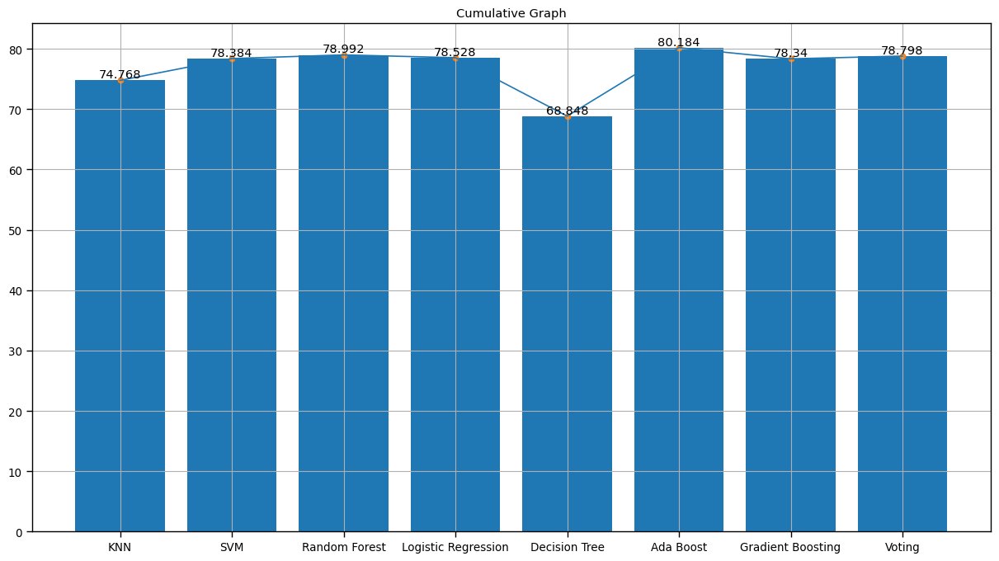

In [125]:
cumulativeModelAccuracyGraph()

#### Function to create heatmap

In [126]:
def fnGenerateHeatMap():
    
    plt.rcParams["figure.figsize"] = (30,20)
    sns.heatmap(df[:].corr(),annot = True,fmt='.1g',linecolor='white',cmap="YlGnBu",linewidths=.5)
    plt.title("Heatmap",fontsize= 18)
    plt.show()

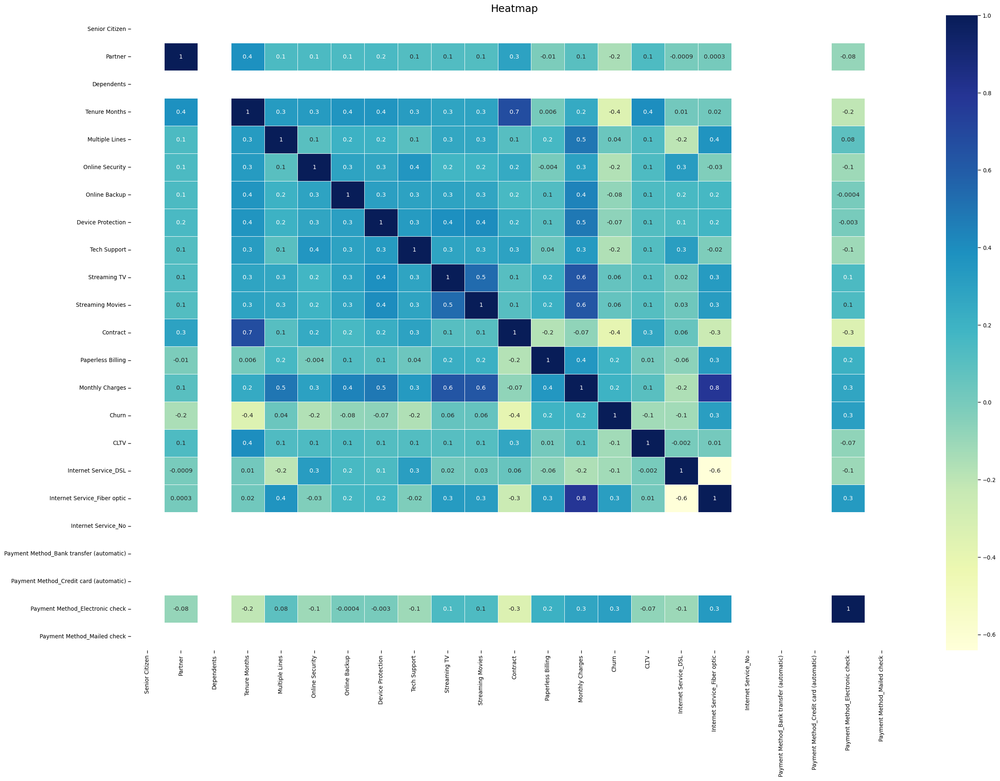

In [127]:
fnGenerateHeatMap()

### Evaluation Type 2 : Receiver Operating Characteristic (ROC)

#### Function to generating ROC graphs

In [128]:
from sklearn.metrics import roc_curve

def generateROCgraphs(fName):

    fig, ax = plt.subplots(ncols=2, nrows=4, figsize=(10, 12))
    fig.tight_layout(pad=5.0)

    models = [model_knn, model_svc, model_rf, model_lr, model_dt, model_abc, model_gbc, model_vc]
    modelN = ['KNN', 'SVM', 'Random Forest', 'Logistic Regression', 'Decision Tree', 'Ada Boost', 'Gradient Boosting', 'VC']

    j = 0
    k = 0
    
    colors = ['red','green','blue','yellow', 'brown', 'black', 'orange', 'pink']

    for i in range(len(models)):

        y_pred_prob = models[i].predict_proba(X_test)[:,1]
        fpr_rf, tpr_rf, thresholds = roc_curve(y_test, y_pred_prob)

        ax[j][k].plot([0, 1], [0, 1], 'k--' )
        ax[j][k].plot(fpr_rf, tpr_rf, label=modelN[i],color = "r")
        ax[j][k].set(title=f'{modelN[i]} ROC Curve', xlabel='False Positive Rate', ylabel='True Positive Rate')

        if k == 1:
            j = j + 1
            k = 0
            continue

        k = k + 1

    
    fig.suptitle(fName, fontsize = 16, weight = 'extra bold', y=0.9)
    plt.savefig(f'{fName}.png', dpi=100)
 
    fig.tight_layout(pad=5.0)

    l = 0    

    fig, ax = plt.subplots(figsize=(15, 10))
    
    for i in range(len(models)):

        y_pred_prob = models[i].predict_proba(X_test)[:,1]
        fpr_rf, tpr_rf, thresholds = roc_curve(y_test, y_pred_prob)

        ax.plot([0, 1], [0, 1], 'k--' )
        ax.plot(fpr_rf, tpr_rf, label=modelN[i],color = colors[l])
        ax.set(xlabel='False Positive Rate', ylabel='True Positive Rate')       
        ax.legend()

        l = l + 1
    
    fig.suptitle('All ROC Curves', fontsize = 16, weight = 'extra bold', y=1)
    plt.savefig(f'{fName}.png', dpi=100)

#### Call function to generate ROC graphs

/var/folders/kr/26ckztk90nndnzrcxhyjjwzm0000gn/T/ipykernel_1571/2151060448.py:36: UserWarning:

The figure layout has changed to tight



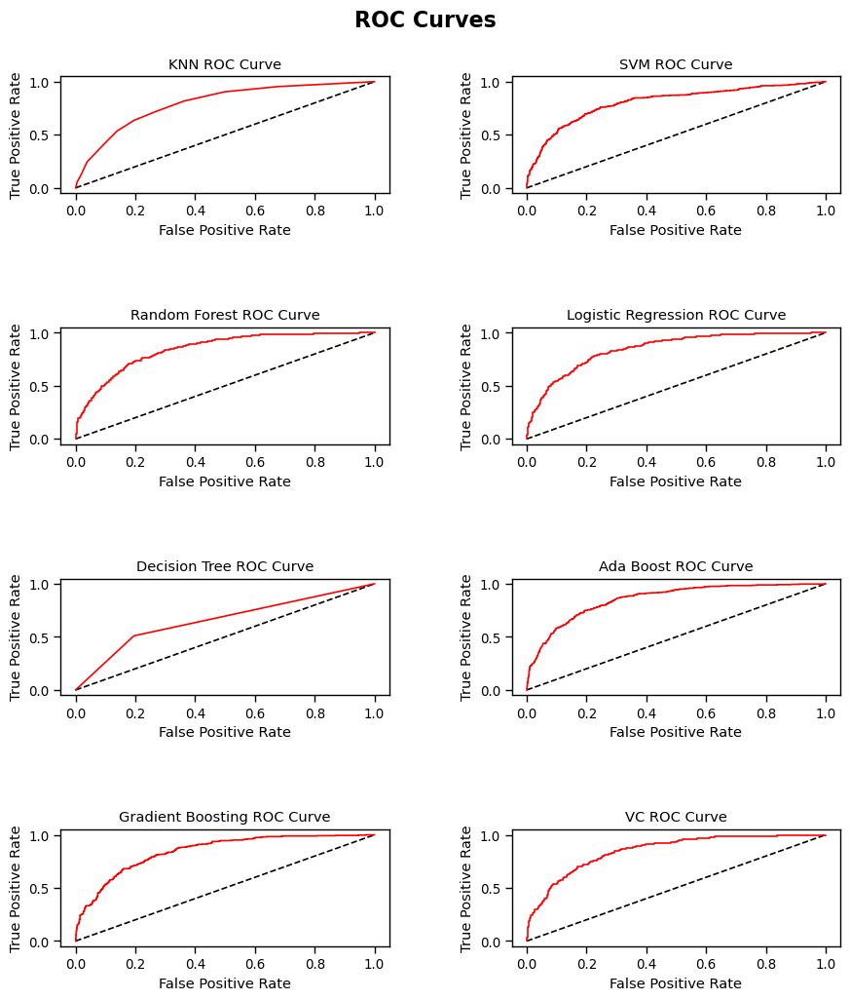

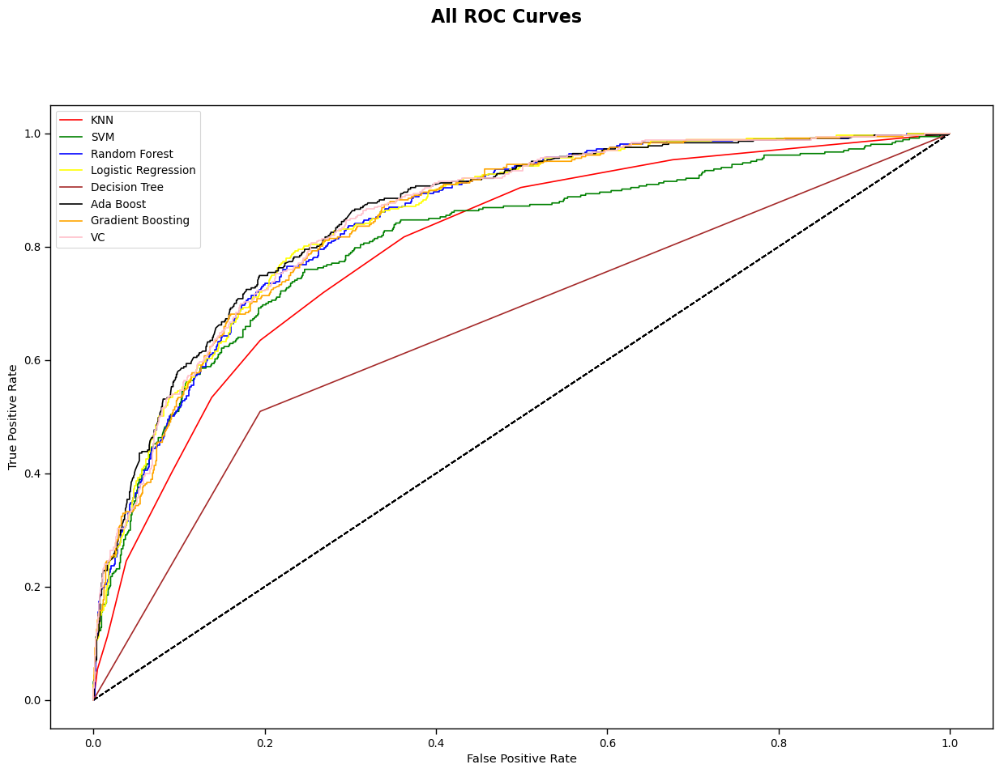

In [129]:
generateROCgraphs('ROC Curves')

#### Selecting the most important features

In [130]:
# Calculate feature importances
feature_importances = model_abc.feature_importances_

# Sort and rank features by importance
sorted_indices = np.argsort(feature_importances)[::-1]

# Important columns
colNamesToBeRemoved = []

# Print the ranked list of feature names and their importances
for idx in sorted_indices:
    if feature_importances[idx] == 0.0:
        colNamesToBeRemoved.append(df.columns[idx])
        print(f"Feature: {df.columns[idx]}, Importance: {feature_importances[idx]}")

Feature: Partner, Importance: 0.0
Feature: Dependents, Importance: 0.0
Feature: Payment Method_Electronic check, Importance: 0.0
Feature: Online Backup, Importance: 0.0
Feature: Device Protection, Importance: 0.0
Feature: Internet Service_Fiber optic, Importance: 0.0
Feature: Internet Service_No, Importance: 0.0
Feature: Payment Method_Bank transfer (automatic), Importance: 0.0
Feature: Senior Citizen, Importance: 0.0


#### By analyzing the importance of the features, the below columns can be removed from the dataset and build the models for the second time.

In [131]:
colNamesToBeRemoved

['Partner',
 'Dependents',
 'Payment Method_Electronic check',
 'Online Backup',
 'Device Protection',
 'Internet Service_Fiber optic',
 'Internet Service_No',
 'Payment Method_Bank transfer (automatic)',
 'Senior Citizen']

#### Dropping columns that have low correlation

In [132]:
df.drop(colNamesToBeRemoved, axis=1, inplace=True)

#### Heatmap

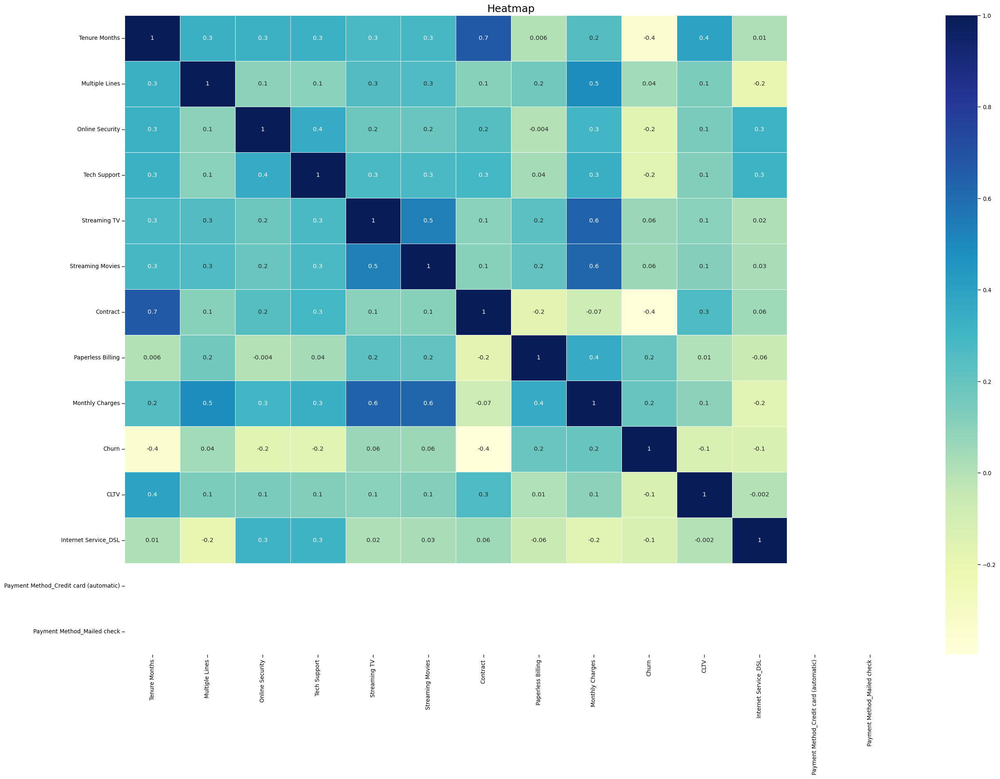

In [133]:
fnGenerateHeatMap()

In [134]:
# Column names
df.columns

Index(['Tenure Months', 'Multiple Lines', 'Online Security', 'Tech Support',
       'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing',
       'Monthly Charges', 'Churn', 'CLTV', 'Internet Service_DSL',
       'Payment Method_Credit card (automatic)',
       'Payment Method_Mailed check'],
      dtype='object')

# ===========================================================

# Retrain the models after removing some features : Analiyzed

#### View final profiling report

In [135]:
if showViz == 1:
    runProfilingReport('Final Data Analysis')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profile Report processing time : 0:00:08.760974


#### Machine learning results dataframe re-initializing

In [136]:
df_ml_eval.drop(df_ml_eval.index, inplace=True)

In [137]:
df_ml_eval = pd.DataFrame({'ATTEMPT':[], 'ALGORITHM':[], 'TIME':[]})

#### Re-initializing the X_train, X_test, y_train, y_test objects

In [138]:
X_train = X_test = df.drop(df.index)
y_train = y_test = df.drop(df.index)

#### Splitting the new dataframe

In [139]:
splitDataset(df)
replaceYesNo()

#### Calling models training function

In [140]:
model_knn, model_svc, model_rf, model_lr, model_dt, model_abc, model_gbc, model_vc, prediction_knn, prediction_svm, prediction_lr, prediction_rf, prediction_dt, prediction_abc, prediction_gbc, prediction_vc = runModelTrainFunctions()


KNN accuracy : 0.7885024840312278
KNN time : 0.487039

Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.88      0.86      1042
         1.0       0.61      0.53      0.57       367

    accuracy                           0.79      1409
   macro avg       0.72      0.71      0.71      1409
weighted avg       0.78      0.79      0.78      1409

SVM accuracy : 0.7977288857345636
SVM time : 5.875629

Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.91      0.87      1042
         1.0       0.65      0.49      0.56       367

    accuracy                           0.80      1409
   macro avg       0.74      0.70      0.71      1409
weighted avg       0.79      0.80      0.79      1409

Random Forest accuracy : 0.808374733853797
Random Forest time : 1.323711

Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.92      0.

#### Generate Confusion Matrix graphs

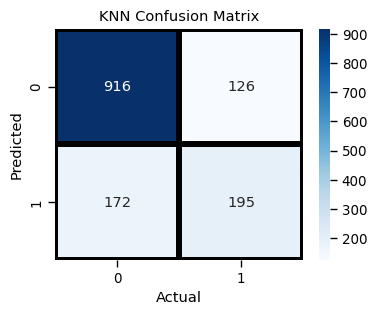

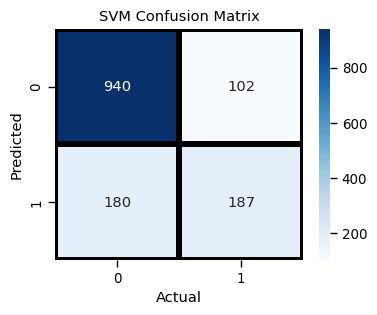

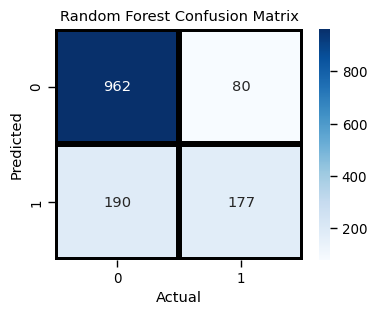

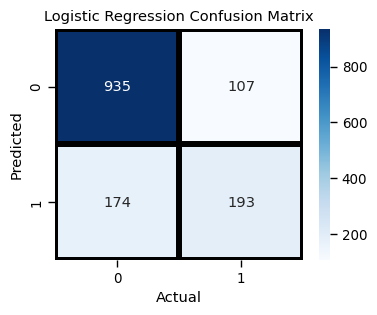

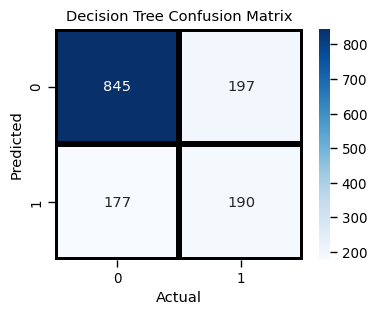

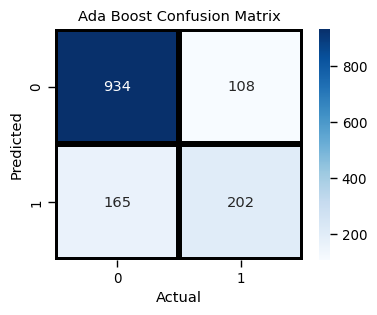

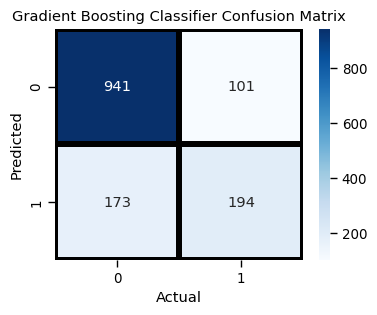

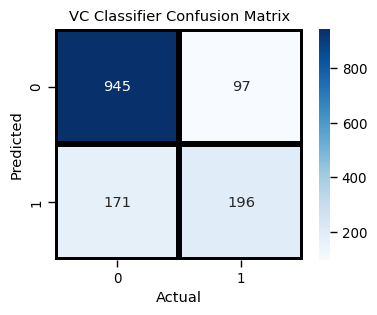

In [141]:
generateConfusionMatrixGraphs_All(attempt)

#### Call function to create Confusion Matrix Arrays - Accuracy, Sensivity, Specificity, Recall & F1_Score

In [142]:
cm_knn, cm_svc, cm_rf, cm_lr, cm_dt, cm_abc, cm_gbc, cm_vc = confusionMatrixArrays()

In [143]:
cm_knn, cm_svc, cm_rf, cm_lr, cm_dt, cm_abc, cm_gbc, cm_vc

(Predicted  0.0  1.0
 Actual             
 0.0        916  126
 1.0        172  195,
 Predicted  0.0  1.0
 Actual             
 0.0        940  102
 1.0        180  187,
 Predicted  0.0  1.0
 Actual             
 0.0        962   80
 1.0        190  177,
 Predicted  0.0  1.0
 Actual             
 0.0        935  107
 1.0        174  193,
 Predicted  0.0  1.0
 Actual             
 0.0        845  197
 1.0        177  190,
 Predicted  0.0  1.0
 Actual             
 0.0        934  108
 1.0        165  202,
 Predicted  0.0  1.0
 Actual             
 0.0        941  101
 1.0        173  194,
 Predicted  0.0  1.0
 Actual             
 0.0        945   97
 1.0        171  196)

#### Call function to append 'df_ml_eval' DataFrame with sensivity and specificity data

In [144]:
appendConfusionMatrixResults()

#### Call function for calculating accuracy, sensitivity, specificity, recall & F1_score¶

In [145]:
calculateAccSensiSpeciRecallF1Score()

#### Call function for plotting accuracy, sensitivity, specificity, recall, F1_score & time

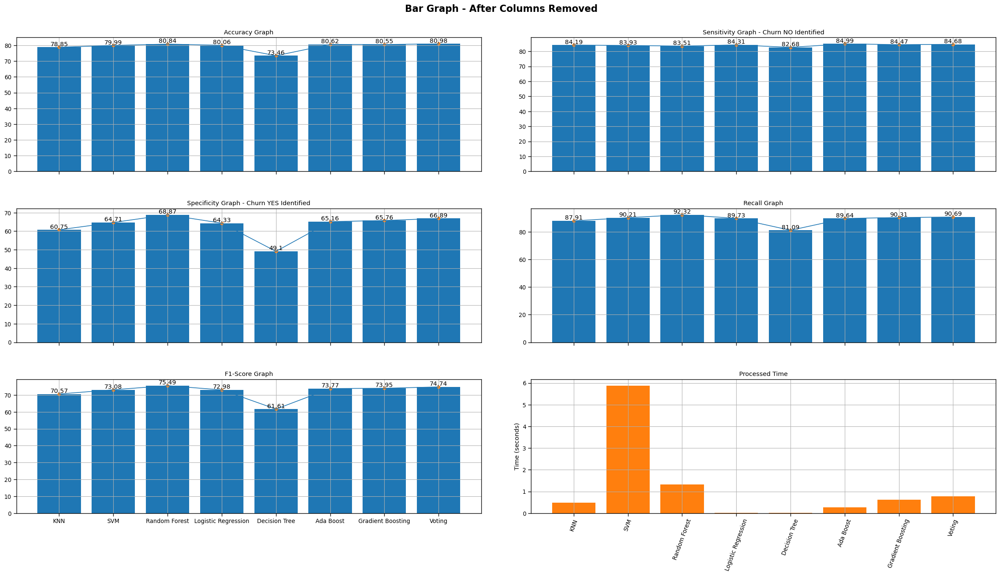

In [146]:
modelComparisionPlot('Bar Graph - After Columns Removed')

In [147]:
df_ml_eval['CUMULATIVE'] = (df_ml_eval['ACCURACY']+df_ml_eval['SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED']+df_ml_eval['SPECIFICITY-CHURN_YES_IDENTIFIED']+df_ml_eval['PRECISION']+df_ml_eval['F1_SCORE'])/5
df_ml_eval

,ATTEMPT,ALGORITHM,TIME,TP,TN,FP,FN,ACCURACY,SENSITIVITY-RECALL-CHURN_NO_IDENTIFIED,SPECIFICITY-CHURN_YES_IDENTIFIED,PRECISION,F1_SCORE,CUMULATIVE
1,2,KNN,0.487039,916,195,126,172,78.85,84.19,60.75,87.91,70.57,76.454
2,2,SVM,5.875629,940,187,102,180,79.99,83.93,64.71,90.21,73.08,78.384
3,2,Random Forest,1.323711,962,177,80,190,80.84,83.51,68.87,92.32,75.49,80.206
4,2,Logistic Regression,0.016759,935,193,107,174,80.06,84.31,64.33,89.73,72.98,78.282
5,2,Decision Tree,0.021931,845,190,197,177,73.46,82.68,49.10,81.09,61.61,69.588
6,2,Ada Boost,0.266047,934,202,108,165,80.62,84.99,65.16,89.64,73.77,78.836
7,2,Gradient Boosting,0.614015,941,194,101,173,80.55,84.47,65.76,90.31,73.95,79.008
8,2,Voting,0.777517,945,196,97,171,80.98,84.68,66.89,90.69,74.74,79.596


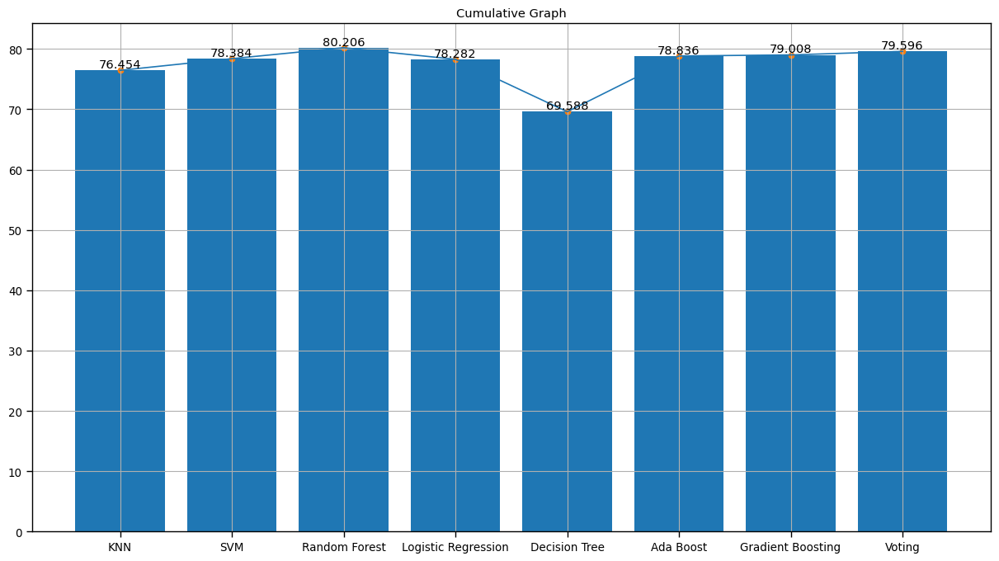

In [148]:
cumulativeModelAccuracyGraph()

#### Call function to generate ROC graphs

/var/folders/kr/26ckztk90nndnzrcxhyjjwzm0000gn/T/ipykernel_1571/2151060448.py:36: UserWarning:

The figure layout has changed to tight



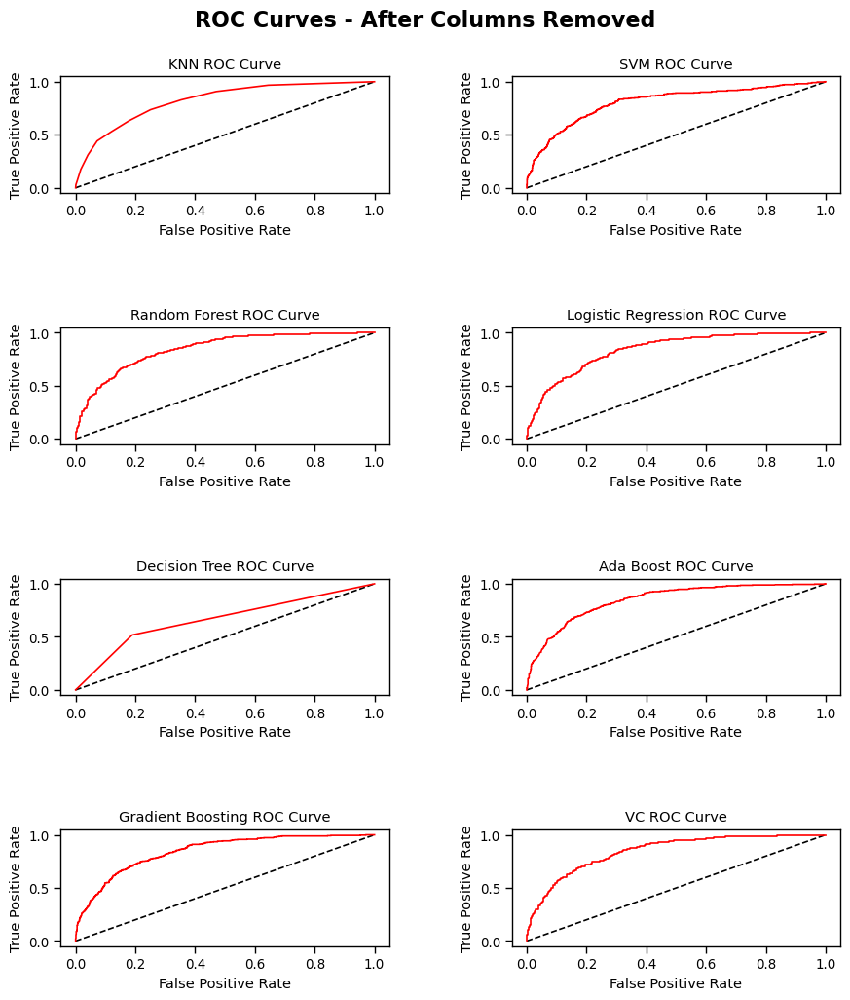

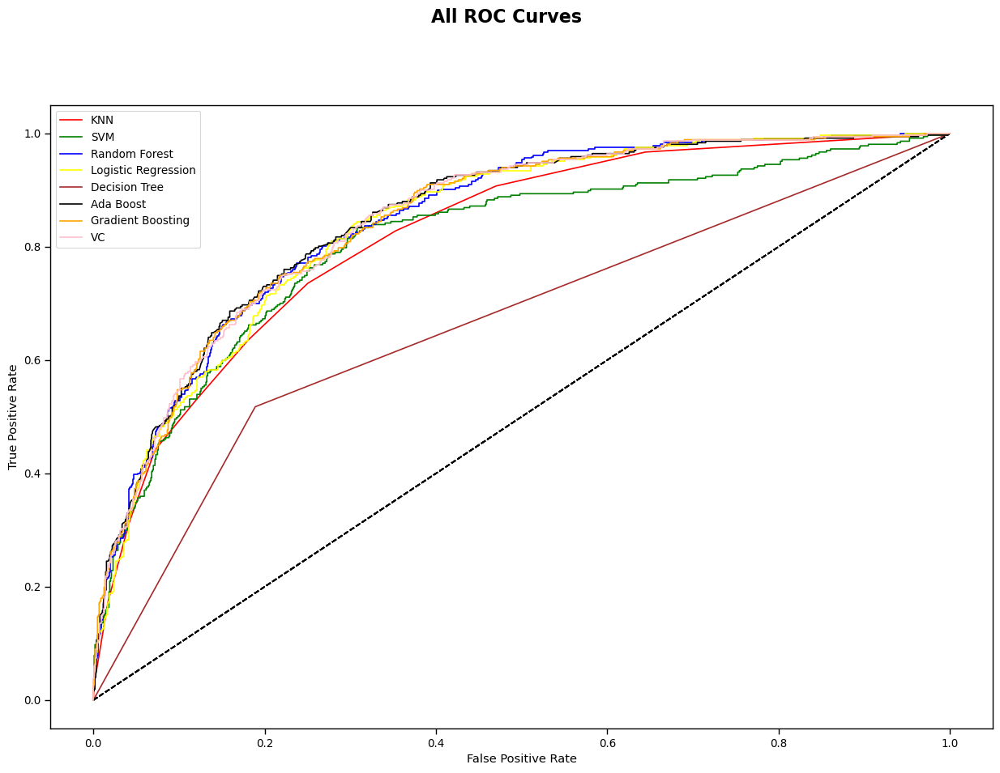

In [149]:
generateROCgraphs('ROC Curves - After Columns Removed')

# Analyzing the correlations of the final dataset

In [150]:
# List of categoricals
categoricals = list()
for x in df.columns:
    if df[x].dtype == 'object':
        categoricals.append(x)
df[categoricals].nunique()

Series([], dtype: float64)

### Pearson Correlation Coefficient

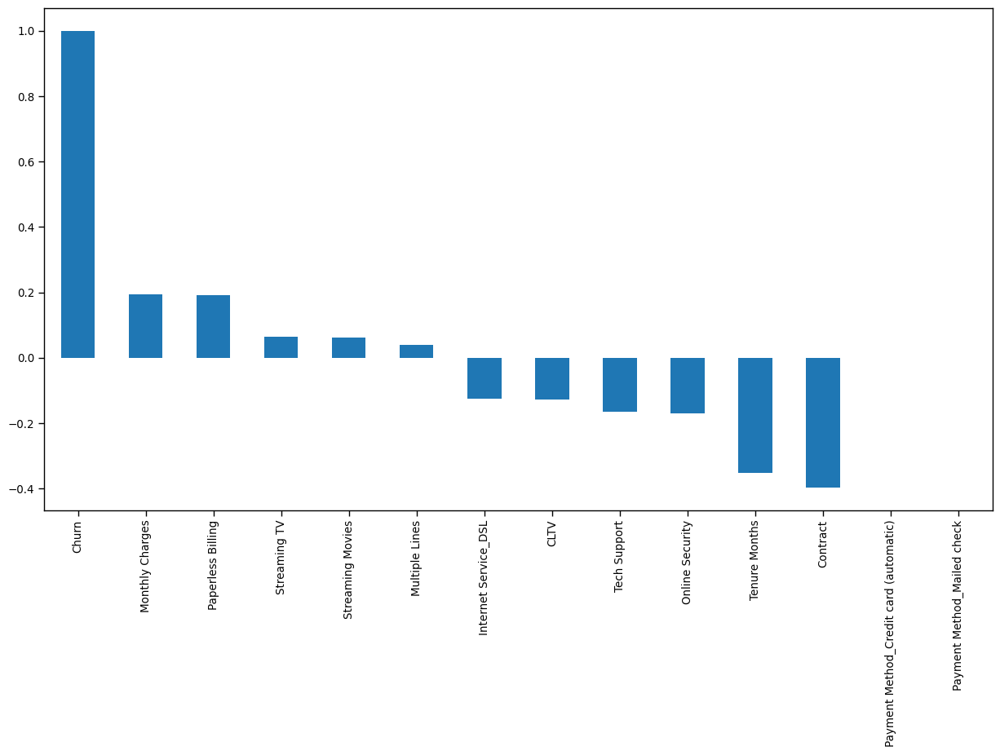

In [151]:
numericals = [x for x in df.columns if x not in categoricals]

plt.figure(figsize=(15,8))
df[numericals].corr(method='pearson')['Churn'].sort_values(ascending = False).plot(kind='bar');

# *****************************************************************************************

## < Finalizing The Most Suitable Model >

## < Model Deployment >

### Importing the 'joblib' library

In [152]:
import joblib

### Save the model as a file

This exported trained model can be used to predict customer churns in the telcom organization. By comparing the analyzed data, 
the 'Ada Boosting Classifier' model has perfomed well in this dataset. Therefore, 'model_abc' is exported as the selected model.

In [153]:
joblib.dump(model_abc, 'model.pkl')

['model.pkl']

# *****************************************************************************************

# Validation : Predicting the Churns of a Given Dataset Using the Deployed Model

### Load the trained model

In [154]:
model = joblib.load('model.pkl')

### Function to predict

In [155]:
def fnPredict():

    global dfHoldout

    # Drop 'Churn' column from the dataset
    dfHoldout.drop('Churn Value', axis=1, inplace=True)

    # Drop 'City' column
    dfHoldout.drop('City', axis=1, inplace=True)
    
    # Apply the custom functions to prepare the dataset for the deployed ML model
    
    # Encoding
    dfHoldout = labelEncoding(dfHoldout)
    dfHoldout = oneHotEncoding(dfHoldout)
    
    # Drop Low correlation features
    dfHoldout.drop(['Churn Label','CustomerID','Country','State','Lat Long','Gender','Phone Service','Total Charges',
                    'Churn Reason','Count','Zip Code','Latitude','Longitude', 'Churn Score'], axis=1, inplace=True)
    
    # Low importance features
    dfHoldout.drop(['Partner',  'Dependents',  'Payment Method_Electronic check', 'Online Backup', 'Device Protection',
                    'Internet Service_Fiber optic', 'Internet Service_No', 'Payment Method_Bank transfer (automatic)', 
                    'Senior Citizen'], axis=1, inplace=True)
    # Scaling
    minMaxScale(dfHoldout)

    # Make predictions
    predictions = model.predict(dfHoldout)

    # Move predicitions in a new column 'Churn'
    dfHoldout['Churn'] = predictions

### Read the data to be prodicted

In [156]:
# There are 502 number of records in the dataset to be predicted
dfHoldout = pd.read_csv('CustomerChurnDataset_Holdout.csv')

In [157]:
df.columns

Index(['Tenure Months', 'Multiple Lines', 'Online Security', 'Tech Support',
       'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing',
       'Monthly Charges', 'Churn', 'CLTV', 'Internet Service_DSL',
       'Payment Method_Credit card (automatic)',
       'Payment Method_Mailed check'],
      dtype='object')

In [158]:
dfHoldout.columns

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')

### Call the 'fnPredict' function and assign the new dataset with the new 'Churn' column

In [159]:
fnPredict()

In [160]:
df.columns

Index(['Tenure Months', 'Multiple Lines', 'Online Security', 'Tech Support',
       'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing',
       'Monthly Charges', 'Churn', 'CLTV', 'Internet Service_DSL',
       'Payment Method_Credit card (automatic)',
       'Payment Method_Mailed check'],
      dtype='object')

In [161]:
dfHoldout.columns

Index(['Tenure Months', 'Multiple Lines', 'Online Security', 'Tech Support',
       'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing',
       'Monthly Charges', 'CLTV', 'Internet Service_DSL',
       'Payment Method_Credit card (automatic)', 'Payment Method_Mailed check',
       'Churn'],
      dtype='object')

### View the predicted churn column of the  dataset

In [162]:
dfHoldout

,Tenure Months,Multiple Lines,Online Security,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Monthly Charges,CLTV,Internet Service_DSL,Payment Method_Credit card (automatic),Payment Method_Mailed check,Churn
0,0.323944,1.0,1.0,0.5,1.0,1.0,0.0,0.0,0.894684,0.281090,1.0,0.0,1.0,0.0
1,0.352113,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.547643,0.324180,1.0,1.0,0.0,0.0
2,0.056338,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.012538,0.168788,1.0,1.0,0.0,0.0
3,0.718310,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.548144,0.814021,1.0,0.0,0.0,0.0
4,0.056338,0.0,1.0,0.0,0.5,0.5,0.0,1.0,0.628385,0.746149,1.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,0.929577,1.0,0.0,0.0,1.0,0.0,0.5,0.0,0.006018,0.955570,1.0,0.0,0.0,0.0
498,0.901408,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.002006,0.675151,1.0,0.0,0.0,0.0
499,0.774648,0.0,0.0,0.0,0.0,1.0,0.5,1.0,0.761284,0.854878,0.0,0.0,1.0,0.0
500,0.816901,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.509027,0.283992,0.0,0.0,0.0,0.0


### Churn distribution of the validation dataset

In [163]:
if showViz == 1:
    fnChurnDistribution(dfHoldout)

In [164]:
print(f'Total time : {(datetime.now()-mainStartTime)}')

Total time : 0:01:45.972185


# END OF THE CODE